In [63]:
#peu etre anomalie dans la cuisine 
#la chambre 2 n'ait pas ouverte 

In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np 
import seaborn as sns 
#from pandas_profiling import ProfileReport 
#import sweetviz as sv
#import dtale
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score,confusion_matrix,classification_report
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
#from sklearn.pipeline import make_pipeline
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import xgboost as xgb


In [2]:
DecisionTreeClassifier =DecisionTreeClassifier(random_state=0)
RandomForest =RandomForestClassifier(n_estimators=50, random_state=0,)
AdaBoost = AdaBoostClassifier(random_state=0)
Regression_logistic=LogisticRegression(random_state = 0)
SVM = SVC(random_state=0)
KNN = KNeighborsClassifier()
XGboost = XGBClassifier()

In [3]:
dict_of_models = {'DecisionTreeClassifier':DecisionTreeClassifier,
                  'RandomForest': RandomForest,
                  'AdaBoost' : AdaBoost,
                  'XGboost':XGboost,
                  'Regression_logistic':Regression_logistic,
                  'SVM': SVM,
                  'KNN': KNN
                  
                 }

In [4]:
def evaluation(model):
    
    model.fit(X1_train, y1_train)
    ypred = model.predict(X1_test)
    
    print(confusion_matrix(y1_test, ypred))
    print(classification_report(y1_test, ypred))
    print('=======================================================')

In [5]:
def evaluation2(model):
    
    model.fit(X2_train, y2_train)
    y2pred = model.predict(X2_test)
    
    print(confusion_matrix(y2_test, y2pred))
    print(classification_report(y2_test, y2pred))
    print('=======================================================')

In [6]:
def evaluation_c(model):
    
    model.fit(Xc_train, yc_train)
    ycpred = model.predict(Xc_test)
    
    print(confusion_matrix(yc_test, ycpred))
    print(classification_report(yc_test, ycpred))
    print('=======================================================')

In [7]:
def evaluation_s(model):
    
    model.fit(Xs_train, ys_train)
    yspred = model.predict(Xs_test)
    
    print(confusion_matrix(ys_test, yspred))
    print(classification_report(ys_test, yspred))
    print('=======================================================')

In [8]:
def evaluation_t(model):
    
    model.fit(Xt_train, yt_train)
    ytpred = model.predict(Xt_test)
    
    print(confusion_matrix(yt_test, ytpred))
    print(classification_report(yt_test, ytpred))
    print('=======================================================')

In [9]:
def importance(evaluation,X):
    for name,model in dict_of_models.items():
        liste=['Regression_logistic','KNN','SVM']
        if name in liste:
            print(name)
            evaluation(model)
        else:
            print(name)
            evaluation(model)
            O=pd.DataFrame(model.feature_importances_,index=X.columns)
            O.columns=['importance']
            O.sort_values(by='importance',inplace=True,ascending=False)
            display(O)

In [10]:
meteo1=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 2/Quivogne campagne 2/Donnees_meteo_Q2.xlsx',index_col='Date')

In [11]:
df1  =pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 2/Quivogne campagne 2/Donnees_Quivogne_Camp2N2_fen_ch1_all_avec_meteo.xlsx')
df2 =pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 2/Quivogne campagne 2/Donnees_Quivogne_Camp2N2_fen_ch2_all_avec_meteo.xlsx')
dfc =pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 2/Quivogne campagne 2/Donnees_Quivogne_Camp2N2_fen_cuisine_all_avec_meteo.xlsx')
dfs =pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 2/Quivogne campagne 2/Donnees_Quivogne_Camp2N2_fen_salon_all_avec_meteo.xlsx')


In [12]:
df11=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 2/Quivogne campagne 2/Fenetre_QuivogneC2_N2.xlsx',sheet_name = "Ch1",index_col='Date')
df22=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 2/Quivogne campagne 2/Fenetre_QuivogneC2_N2.xlsx',sheet_name = "Ch2",index_col='Date')
dfc1=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 2/Quivogne campagne 2/Fenetre_QuivogneC2_N2.xlsx',sheet_name = "Cuisine",index_col='Date')
dfs1=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 2/Quivogne campagne 2/Fenetre_QuivogneC2_N2.xlsx',sheet_name = "Salon",index_col='Date')
df=pd.concat([df11,df22,dfc1,dfs1],axis=1)
#df = df.loc[:,~df.columns.duplicated()]
df.dropna(axis = 0, how = 'any',inplace=True)

print('#========================== CHAMBRE 1  ============================#')
print('date de début d enregistrement des données')
display(df11.index.min()),print('          ----------')
print('date de fin d enregistrement des données')
display(df11.index.max()),print('          ----------')
print('la dimension du dataframe de la chambre  et de:' , )
display(df11.shape)
print('\n')
print('#========================== CHAMBRE 2  ============================#')
print('date de début d enregistrement des données')
display(df22.index.min()),print('          ----------')
print('date de fin d enregistrement des données')
display(df22.index.max()),print('          ----------')
print('la dimension du dataframe de la chambre  et de:' , )
display(df22.shape)
print('\n')
print('#========================== CUISINE ==============================#')
print('date de début d enregistrement des données')
display(dfc1.index.min()),print('         ----------')
print('date de fin d enregistrement des données')
display(dfc1.index.max()),print('         ----------')
print('la dimension du dataframe de la cuisine et de:' , )
display(dfc1.shape)
print('\n')
print('#========================== SALON ================================#')
print('date de début d enregistrement des données')
display(dfs1.index.min()),print('         ----------')
print('date de fin d enregistrement des données')
display(dfs1.index.max()),print('         ----------')
print('la dimension du dataframe du salon et de:' , )
display(dfs1.shape)
print('\n')
print('#======== df résultat de concatination (ch1,ch2,cuisine,salon) =========#')
print('date de début')  
display(df.index.min()),print('         ----------')
print('date de fin')
display(df.index.max()),print('         ----------')
print('la dimension de df :' , )
display(df.shape)
print('\n')
print('                                                            df')
print('\n') 
display(df )
      

#========================== CHAMBRE 1  ============================#
date de début d enregistrement des données


Timestamp('2019-12-12 19:15:00')

          ----------
date de fin d enregistrement des données


Timestamp('2019-12-19 18:45:00')

          ----------
la dimension du dataframe de la chambre  et de:


(2011, 4)



#========================== CHAMBRE 2  ============================#
date de début d enregistrement des données


Timestamp('2019-12-12 19:15:00')

          ----------
date de fin d enregistrement des données


Timestamp('2019-12-19 18:50:00')

          ----------
la dimension du dataframe de la chambre  et de:


(2012, 4)



#========================== CUISINE ==============================#
date de début d enregistrement des données


Timestamp('2019-12-12 19:20:00')

         ----------
date de fin d enregistrement des données


Timestamp('2019-12-19 18:55:00')

         ----------
la dimension du dataframe de la cuisine et de:


(2012, 3)



#========================== SALON ================================#
date de début d enregistrement des données


Timestamp('2019-12-12 19:20:00')

         ----------
date de fin d enregistrement des données


Timestamp('2019-12-19 18:30:00')

         ----------
la dimension du dataframe du salon et de:


(2007, 4)



#======== df résultat de concatination (ch1,ch2,cuisine,salon) =========#
date de début


Timestamp('2019-12-12 19:20:00', freq='5T')

         ----------
date de fin


Timestamp('2019-12-19 18:30:00', freq='5T')

         ----------
la dimension de df :


(2007, 15)



                                                            df




,fen_ch1,T_ch1,HR_ch1,CO2_ch1,fen_ch2,T_ch2,HR_ch2,CO2_ch2,fen_cuisine,T_cuisine,HR_cuisine,fen_salon,T_salon,HR_salon,CO2_salon
Date,,,,,,,,,,,,,,,
2019-12-12 19:20:00,1.0,20.6,33.0,632.0,1.0,21.2,32.0,694.0,1.0,22.393,34.484,0.0,21.7,32.0,780.0
2019-12-12 19:25:00,1.0,20.6,33.0,632.0,1.0,21.2,32.0,694.0,1.0,22.393,34.484,1.0,21.7,32.0,780.0
2019-12-12 19:30:00,1.0,20.9,32.0,685.0,1.0,21.5,32.0,717.0,1.0,22.729,34.648,1.0,22.5,31.0,703.0
2019-12-12 19:35:00,1.0,20.9,32.0,685.0,1.0,21.5,32.0,717.0,1.0,22.729,34.648,1.0,22.5,31.0,703.0
2019-12-12 19:40:00,1.0,21.2,32.0,651.0,1.0,21.8,32.0,724.0,1.0,23.088,36.403,1.0,22.9,30.0,701.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-19 18:10:00,1.0,20.5,44.0,405.0,1.0,20.6,42.0,407.0,0.0,21.413,45.992,1.0,21.5,41.0,406.0
2019-12-19 18:15:00,1.0,20.5,44.0,405.0,1.0,20.6,42.0,407.0,0.0,21.413,45.992,1.0,21.5,41.0,406.0
2019-12-19 18:20:00,1.0,20.5,45.0,421.0,1.0,20.8,43.0,482.0,0.0,21.557,46.361,1.0,21.5,41.0,386.0


In [18]:
df1

,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,fen_ch1,T_ch1,HR_ch1,CO2_ch1
Date,,,,,,,,,,
2019-12-12 19:20:00,0,0,57,174,8.0,5.5,1,20.6,33.0,632.0
2019-12-12 19:25:00,0,0,58,220,8.4,5.5,1,20.6,33.0,632.0
2019-12-12 19:30:00,0,0,59,217,5.6,5.5,1,20.9,32.0,685.0
2019-12-12 19:35:00,0,0,62,183,7.2,5.3,1,20.9,32.0,685.0
2019-12-12 19:40:00,0,0,66,190,7.1,5.0,1,21.2,32.0,651.0
...,...,...,...,...,...,...,...,...,...,...
2019-12-19 18:25:00,0,0,61,128,5.4,14.2,1,20.5,45.0,421.0
2019-12-19 18:30:00,0,0,61,165,5.1,14.2,1,20.5,45.0,430.0
2019-12-19 18:35:00,0,0,61,166,7.0,14.2,1,20.5,45.0,430.0


In [61]:
print('    ##================ info df1 ==============##'),df1.info(),print('    ##================ info df2 ==============##'),df2.info(),print('    ##================ info dfc ==============##'),dfc.info(),print('    ##================ info dfs ==============##'),dfs.info(),print('    ##================ info df ==============##'),df.info()

    ##================ info df1 ==============##
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2011 entries, 0 to 2010
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Date      2011 non-null   datetime64[ns]
 1   Ihg       2011 non-null   int64         
 2   Ihd       2011 non-null   int64         
 3   HR_ext    2011 non-null   int64         
 4   Wd_Vaulx  2011 non-null   int64         
 5   Ws_Vaulx  2011 non-null   float64       
 6   T_ext     2011 non-null   float64       
 7   fen_ch1   2011 non-null   int64         
 8   T_ch1     2010 non-null   object        
 9   HR_ch1    2010 non-null   float64       
 10  CO2_ch1   2010 non-null   float64       
dtypes: datetime64[ns](1), float64(4), int64(5), object(1)
memory usage: 172.9+ KB
    ##================ info df2 ==============##
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2012 entries, 0 to 2011
Data columns (total 11 columns):
 #   Co

(None, None, None, None, None, None, None, None, None, None)

In [13]:
df1['T_ch1'].replace(',','.',regex=True,inplace=True)
df1['T_ch1']=df1['T_ch1'].astype(float)
##==========================================##
df2['T_ch2'].replace(',','.',regex=True,inplace=True)
df2['T_ch2']=df2['T_ch2'].astype(float)
##==========================================##
dfc['T_cuisine'].replace(',','.',regex=True,inplace=True)
dfc['T_cuisine']=dfc['T_cuisine'].astype(float)
                 #===========#
dfc['HR_cuisine'].replace(',','.',regex=True,inplace=True)
dfc['HR_cuisine']=dfc['HR_cuisine'].astype(float)
##==========================================##
dfs['T_salon'].replace(',','.',regex=True,inplace=True)
dfs['T_salon']=dfs['T_salon'].astype(float)


In [63]:
print("Statistiques descriptive des données de la chambre 1")
display(df1.describe()),
print('\n')
print("Statistiques descriptive des données de la chambre 2")
display(df2.describe()),
print('\n')
print("Statistiques descriptive des données de la cuisine")
display(dfc.describe()),
print('\n')
print("Statistiques descriptive des données du salon")
display(dfs.describe())

Statistiques descriptive des données de la chambre 1


,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,fen_ch1,T_ch1,HR_ch1,CO2_ch1
count,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2010.000000,2010.000000,2010.000000
mean,4218.557931,3072.957235,69.092491,173.473894,2.958478,11.047290,0.921432,21.123483,42.924378,648.820896
std,7866.479507,5232.400230,15.233552,60.105676,2.236638,3.824552,0.269130,0.645716,4.806070,213.054095
min,-99.000000,-99.000000,42.000000,1.000000,0.000000,3.100000,0.000000,19.500000,32.000000,358.000000
25%,0.000000,0.000000,55.000000,146.500000,1.300000,8.300000,1.000000,20.700000,40.000000,448.000000
50%,0.000000,0.000000,67.000000,174.000000,2.300000,12.200000,1.000000,21.000000,43.000000,632.000000
75%,5291.000000,4964.500000,84.000000,199.000000,4.400000,14.300000,1.000000,21.700000,46.000000,786.000000
max,41660.000000,25693.000000,94.000000,360.000000,14.100000,17.400000,1.000000,22.300000,53.000000,1200.000000




Statistiques descriptive des données de la chambre 2


,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,fen_ch2,T_ch2,HR_ch2,CO2_ch2
count,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000,2012.0,2011.000000,2011.000000,2011.000000
mean,4216.461233,3071.429920,69.088966,173.470676,2.960089,11.048757,1.0,21.802486,39.945301,559.533068
std,7865.085719,5231.547707,15.230584,60.090903,2.237249,3.824168,0.0,0.720940,4.651003,105.437215
min,-99.000000,-99.000000,42.000000,1.000000,0.000000,3.100000,1.0,20.600000,30.000000,388.000000
25%,0.000000,0.000000,55.000000,146.750000,1.300000,8.300000,1.0,21.200000,38.000000,453.000000
50%,0.000000,0.000000,67.000000,174.000000,2.300000,12.200000,1.0,21.600000,40.000000,561.000000
75%,5283.000000,4961.750000,84.000000,199.000000,4.400000,14.300000,1.0,22.500000,43.000000,632.000000
max,41660.000000,25693.000000,94.000000,360.000000,14.100000,17.400000,1.0,23.200000,49.000000,891.000000




Statistiques descriptive des données de la cuisine


,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,fen_cuisine,T_cuisine,HR_cuisine
count,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000
mean,4216.461233,3071.429920,69.091451,173.473161,2.959891,11.052932,0.275845,22.362688,44.040841
std,7865.085719,5231.547707,15.229019,60.091649,2.237059,3.822801,0.447050,0.667084,5.155577
min,-99.000000,-99.000000,42.000000,1.000000,0.000000,3.100000,0.000000,21.342000,34.166000
25%,0.000000,0.000000,55.000000,146.750000,1.300000,8.300000,0.000000,21.724000,41.651000
50%,0.000000,0.000000,67.000000,174.000000,2.300000,12.200000,0.000000,22.465000,44.066500
75%,5283.000000,4961.750000,84.000000,199.000000,4.400000,14.300000,1.000000,22.896000,47.263000
max,41660.000000,25693.000000,94.000000,360.000000,14.100000,17.400000,1.000000,25.137000,72.300000




Statistiques descriptive des données du salon


,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,fen_salon,T_salon,HR_salon,CO2_salon
count,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000
mean,4226.965620,3079.081714,69.110115,173.497260,2.951071,11.045391,0.990035,22.815097,37.686597,551.780269
std,7872.060462,5235.812950,15.243367,60.158082,2.232402,3.824569,0.099352,0.893589,4.555839,112.082810
min,-99.000000,-99.000000,42.000000,1.000000,0.000000,3.100000,0.000000,21.400000,28.000000,372.000000
25%,0.000000,0.000000,55.000000,147.000000,1.300000,8.300000,1.000000,21.900000,36.000000,474.000000
50%,0.000000,0.000000,67.000000,174.000000,2.300000,12.200000,1.000000,22.600000,38.000000,547.000000
75%,5322.000000,4971.000000,84.000000,199.000000,4.400000,14.300000,1.000000,23.700000,41.000000,619.000000
max,41660.000000,25693.000000,94.000000,360.000000,14.100000,17.400000,1.000000,24.300000,47.000000,1060.000000


array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

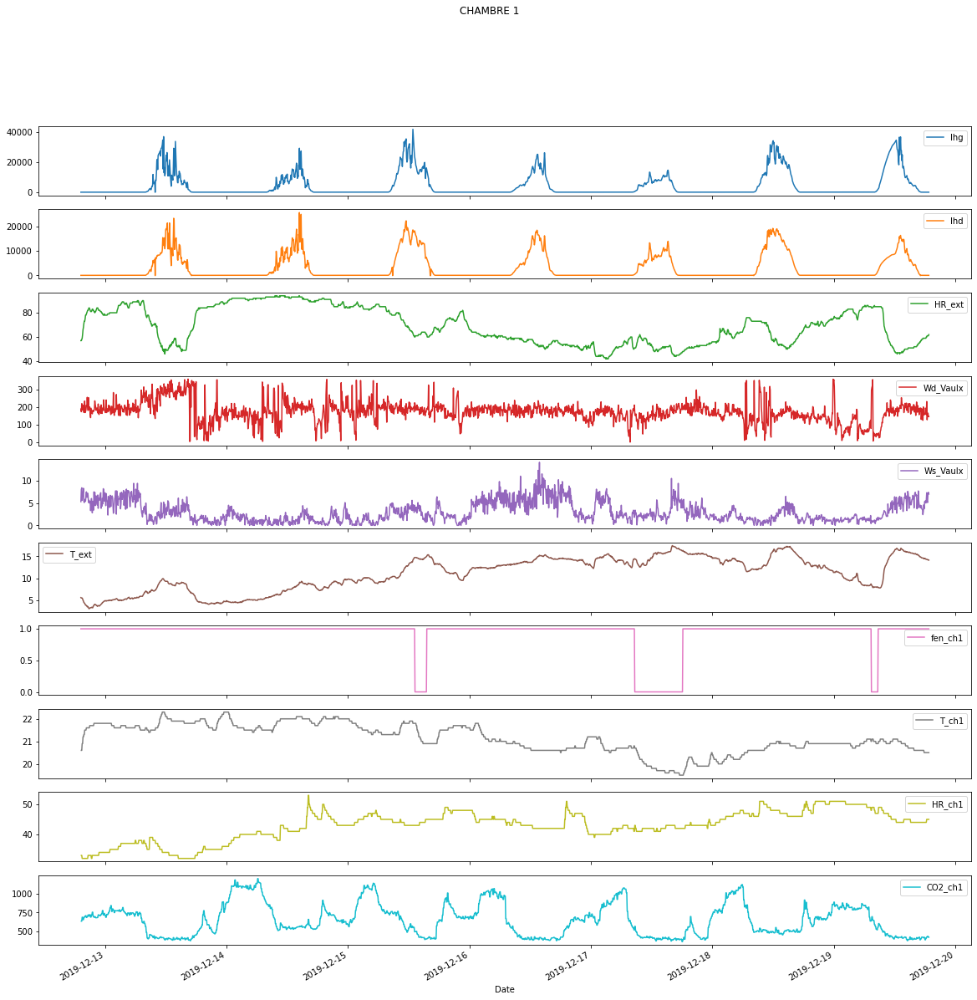

In [64]:
df1.plot(x='Date',x_compat=True,subplots=True,figsize=(20,20),title='CHAMBRE 1')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

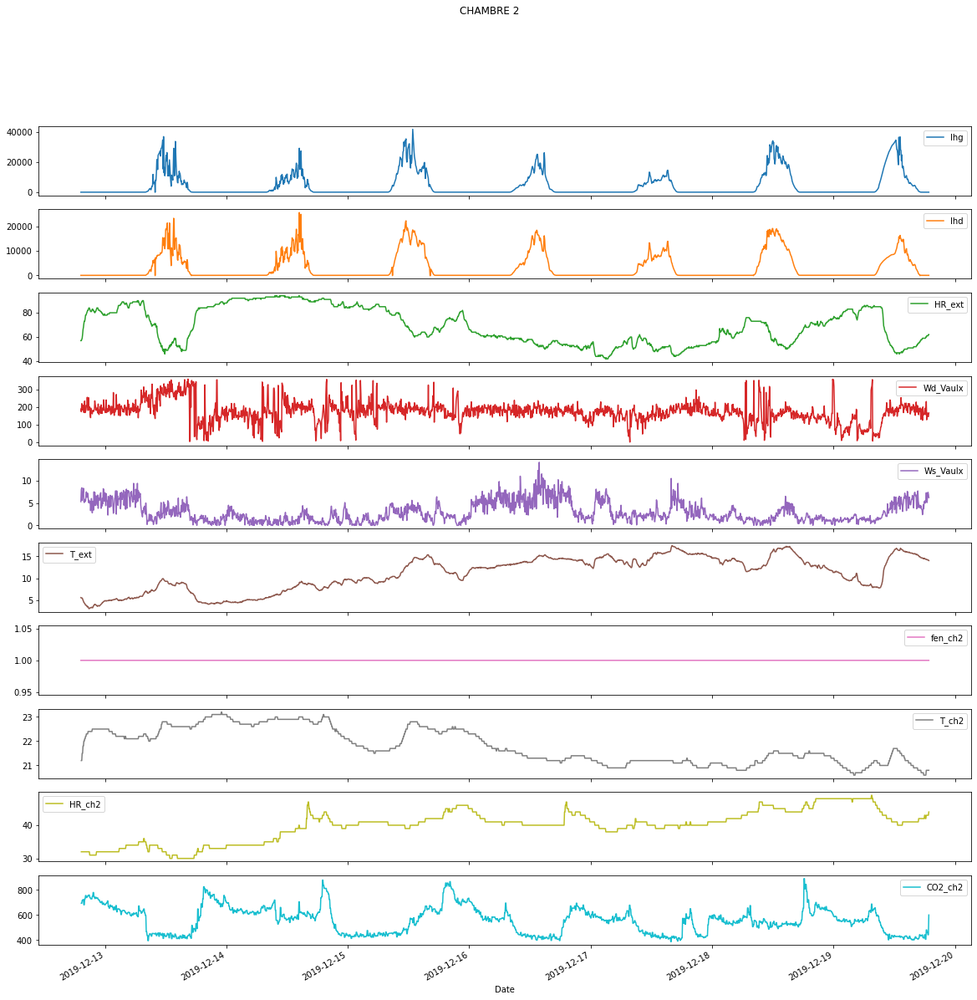

In [65]:
df2.plot(x='Date',x_compat=True,subplots=True,figsize=(20,20),title='CHAMBRE 2')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>], dtype=object)

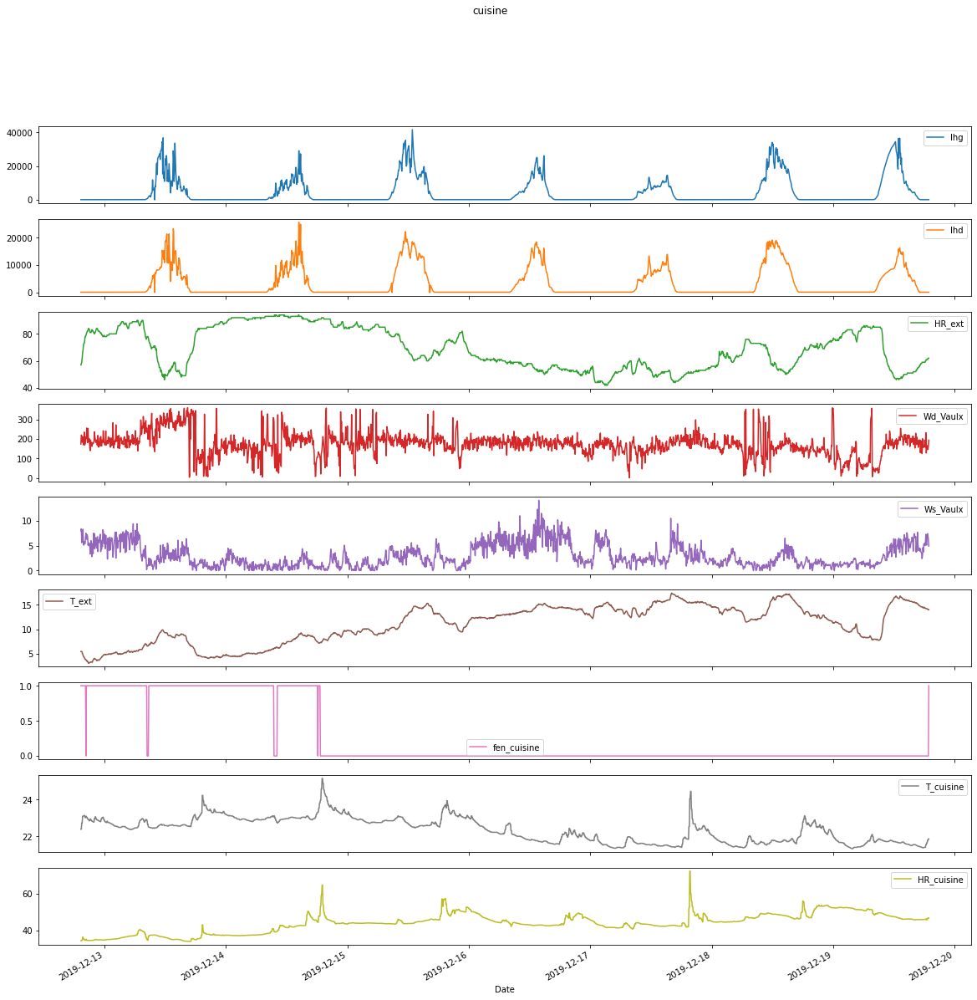

In [66]:
dfc.plot(x='Date',x_compat=True,subplots=True,figsize=(20,20),title='cuisine')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

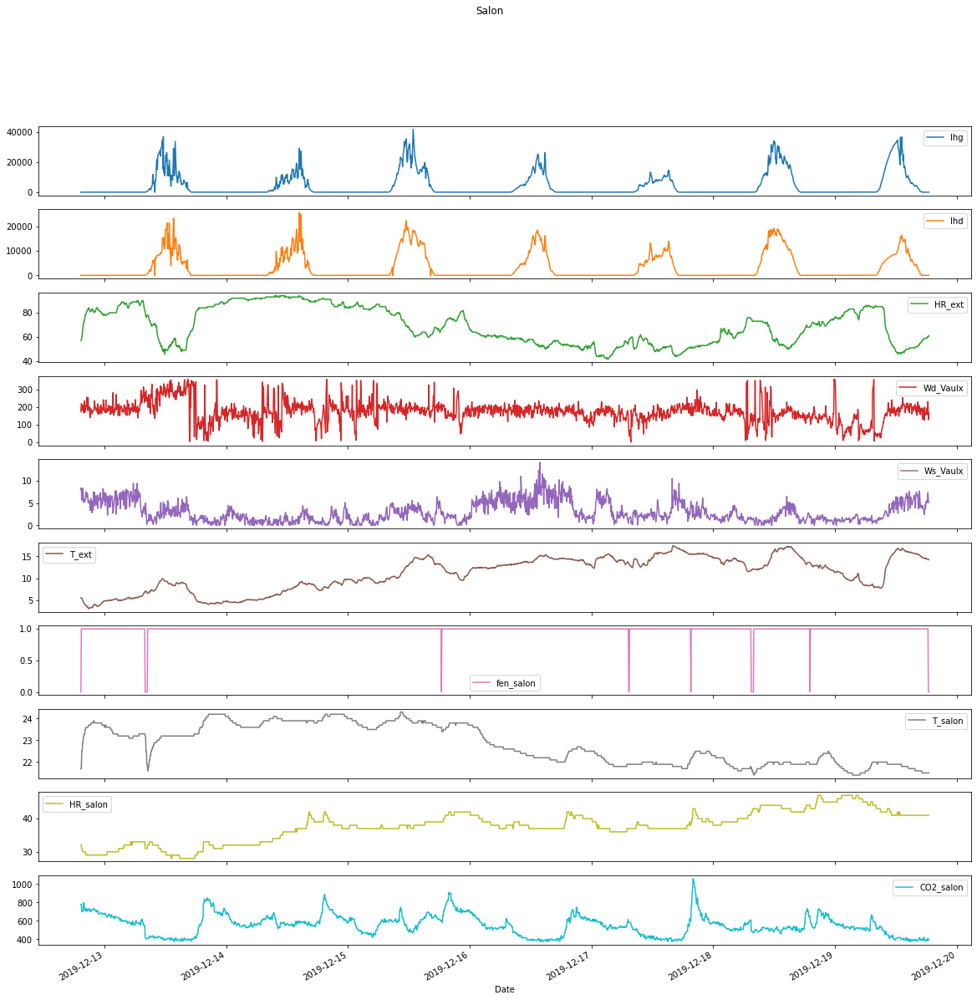

In [67]:
dfs.plot(x='Date',x_compat=True,subplots=True,figsize=(20,20),title='Salon')

## Exploration des données & Data Analysis 


*Analyse de Forme : 

    variable target : fen_ch1
    lignes et colonnes : 2011, 11
    types de variables : qualitatives : 1, quantitatives : 9 , date : 1 
    Analyse des valeurs manquantes : premiere ligne 3 valeur 


## Taux d'ouverture de chaque fenetre  

(<AxesSubplot:title={'center':'Camp2N2'}, ylabel='fen_ch1'>,
 1    0.921432
 0    0.078568
 Name: fen_ch1, dtype: float64)

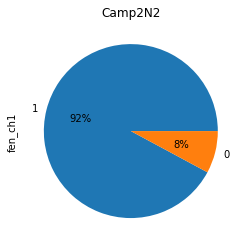

In [68]:
df1['fen_ch1'].value_counts().plot.pie(autopct='%1.0f%%',title='Camp2N2'),df1['fen_ch1'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'Camp2N2'}, ylabel='fen_ch2'>,
 1    1.0
 Name: fen_ch2, dtype: float64)

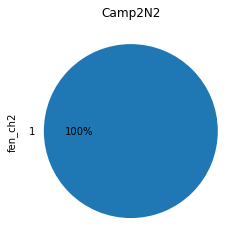

In [69]:
df2['fen_ch2'].value_counts().plot.pie(autopct='%1.0f%%',title='Camp2N2'),df2['fen_ch2'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'Camp2N2'}, ylabel='fen_cuisine'>,
 0    0.724155
 1    0.275845
 Name: fen_cuisine, dtype: float64)

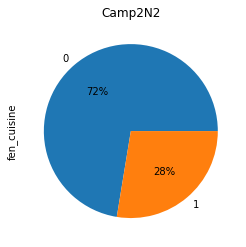

In [70]:

dfc['fen_cuisine'].value_counts().plot.pie(autopct='%1.0f%%',title='Camp2N2'),dfc['fen_cuisine'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'Camp2N2'}, ylabel='fen_salon'>,
 1    0.990035
 0    0.009965
 Name: fen_salon, dtype: float64)

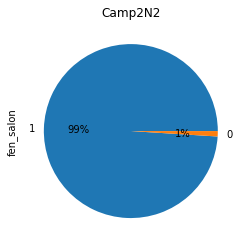

In [71]:
dfs['fen_salon'].value_counts().plot.pie(autopct='%1.0f%%',title='Camp2N2'),dfs['fen_salon'].value_counts(normalize=True)

# Distrubution des données 

##  Cuisine


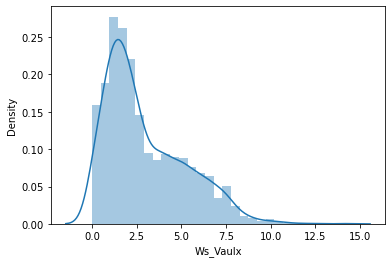

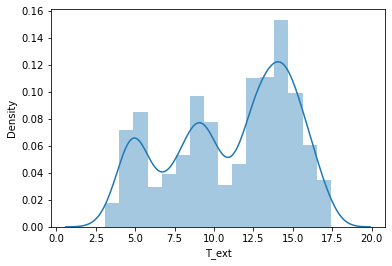

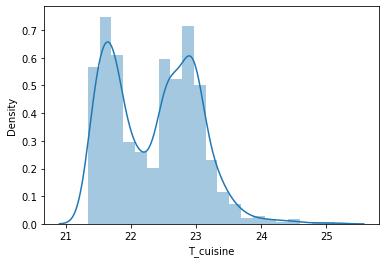

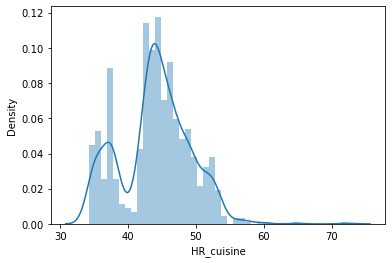

In [72]:

for col in dfc.select_dtypes('float'):
    plt.figure()
    sns.distplot(dfc[col])#.set(title='cuisine')


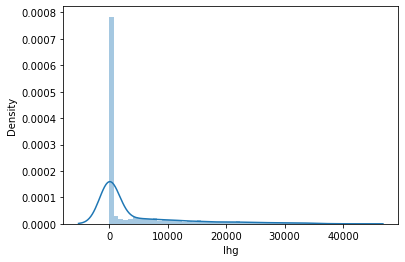

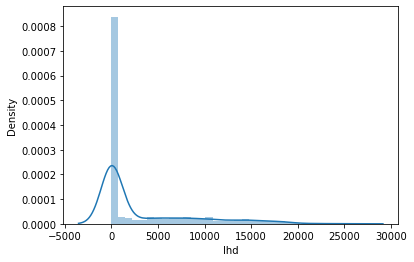

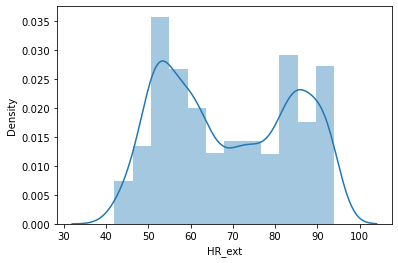

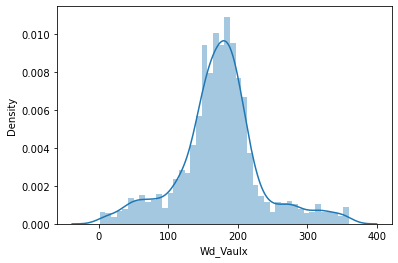

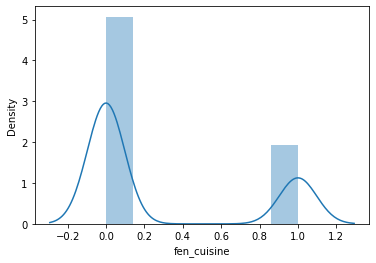

In [73]:
for col in dfc.select_dtypes('int'):
    plt.figure()
    sns.distplot(dfc[col])

## Chambre 1 

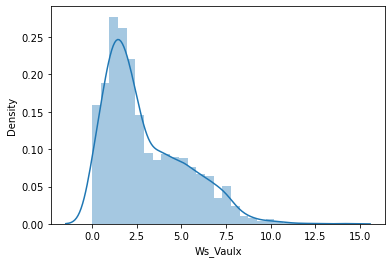

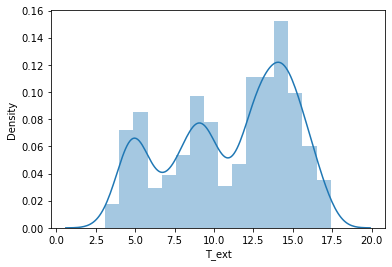

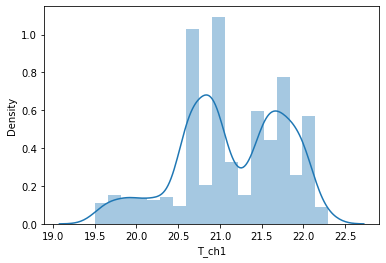

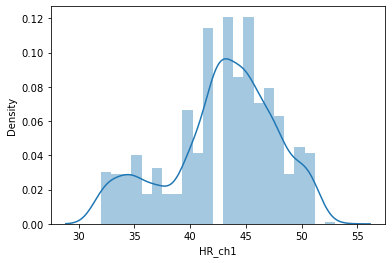

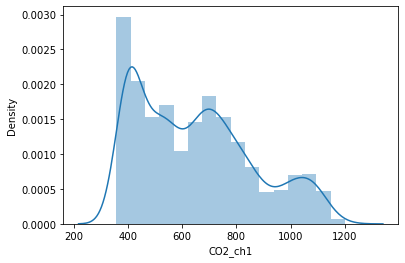

In [22]:
for col in df1.select_dtypes('float'):
    plt.figure()
    sns.distplot(df1[col])

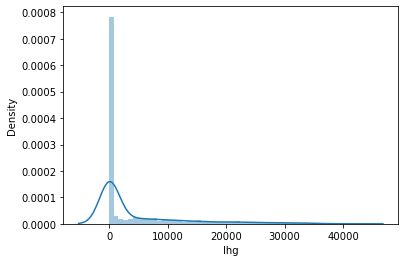

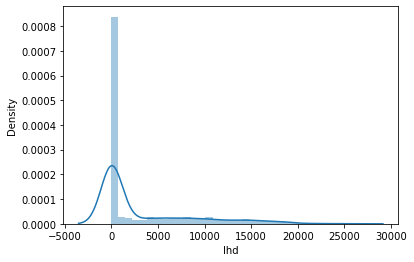

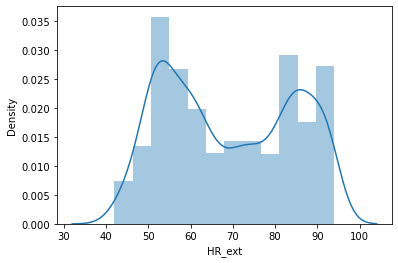

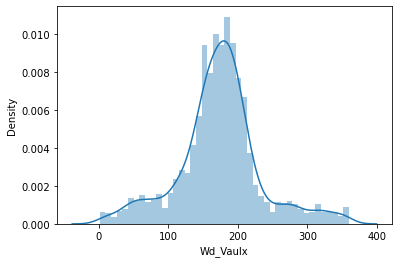

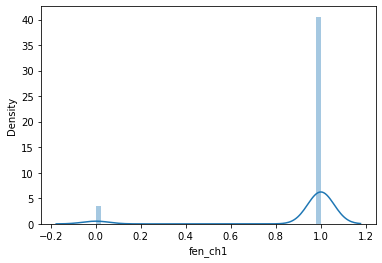

In [72]:
for col in df1.select_dtypes('int'):
    plt.figure()
    sns.distplot(df1[col])

## chambre 2 


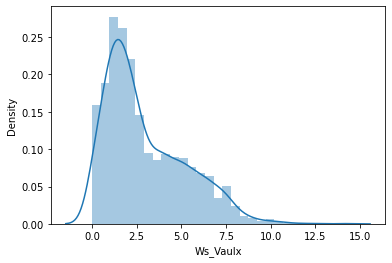

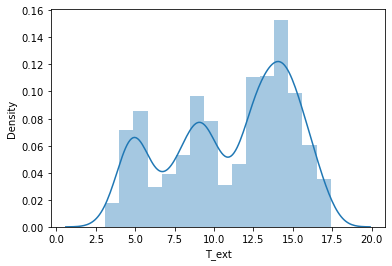

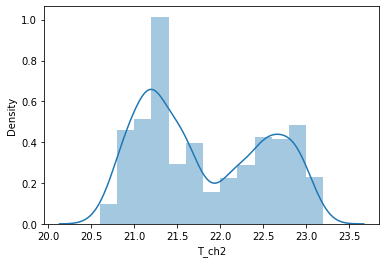

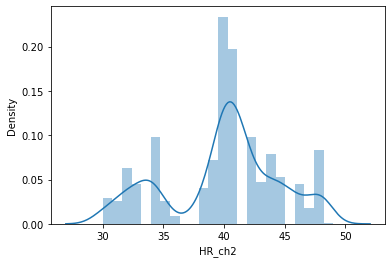

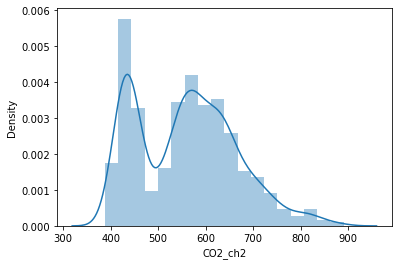

In [25]:
for col in df2.select_dtypes('float'):
    plt.figure()
    sns.distplot(df2[col])#.set(title='chambre 2')

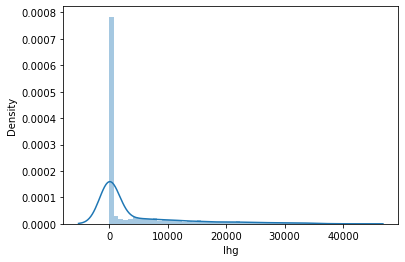

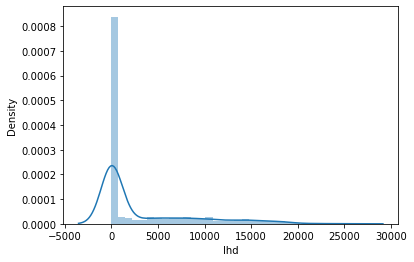

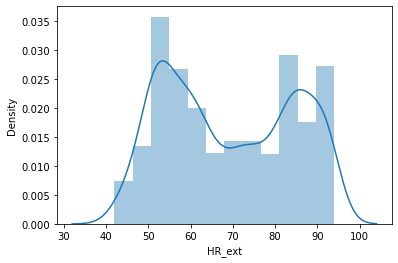

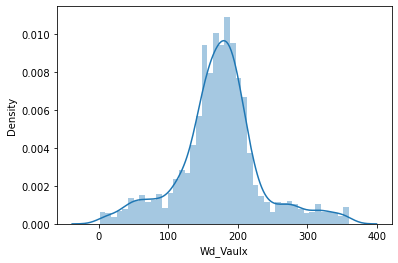

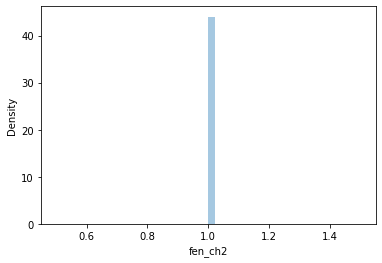

In [26]:
for col in df2.select_dtypes('int'):
    plt.figure()
    sns.distplot(df2[col])#.set(title='chambre 2')

## Salon

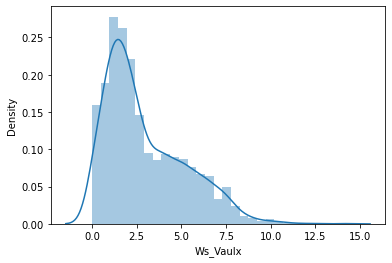

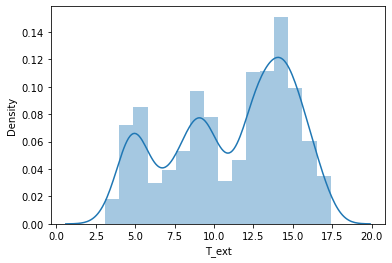

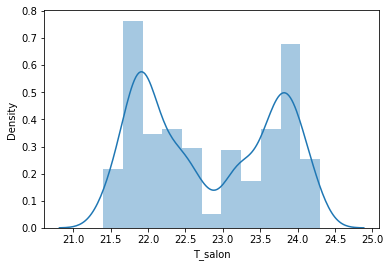

In [27]:
for col in dfs.select_dtypes('float'):
    plt.figure()
    sns.distplot(dfs[col])#.set(title='salon')

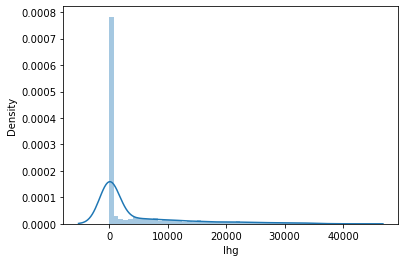

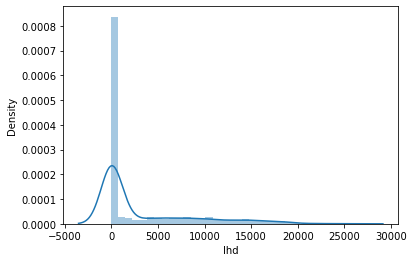

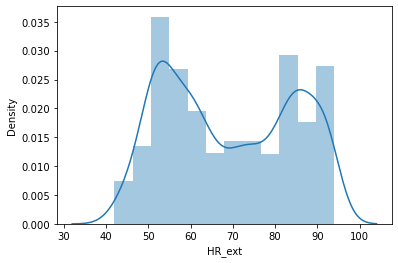

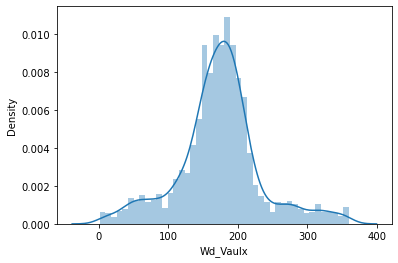

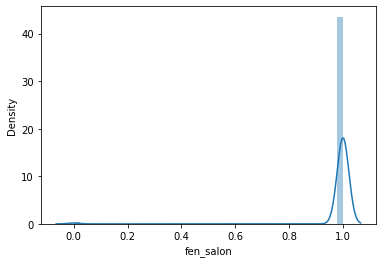

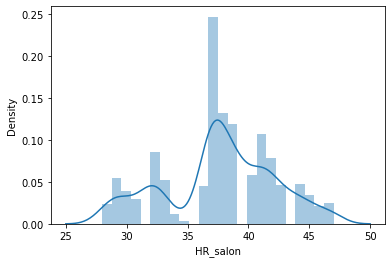

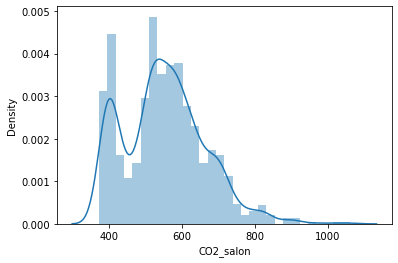

In [28]:
for col in dfs.select_dtypes('int'):
    plt.figure()
    sns.distplot(dfs[col])#.set(title='salon')

# Création de sous-ensembles fenetre ouverte et fermée Pour voir quelle données impact l'ouverture des fenetre 

ensembles de fenetres fermées

In [17]:
f1_df = df1[df1['fen_ch1']==1]
f2_df = df2[df2['fen_ch2']==1]
fc_df = dfc[dfc['fen_cuisine']==1]
fs_df = dfs[dfs['fen_salon']==1]


ensembles de fenetres ouvertes

In [18]:
o1_df = df1[df1['fen_ch1']==0]
o2_df = df2[df2['fen_ch2']==0]
oc_df = dfc[dfc['fen_cuisine']==0]
os_df = dfs[dfs['fen_salon']==0]


### Relation entre les mémes variables de la chambre 1,pendant la ferméture et l'ouverture des fenetres   

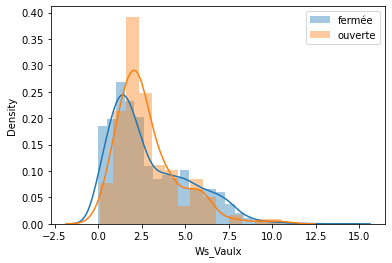

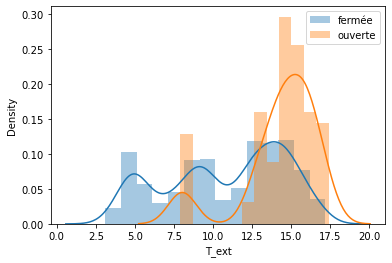

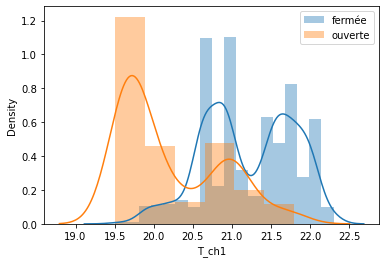

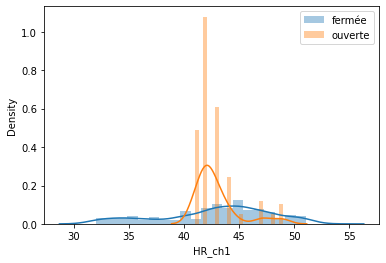

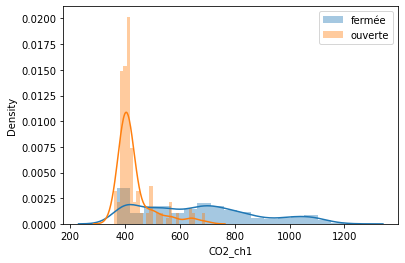

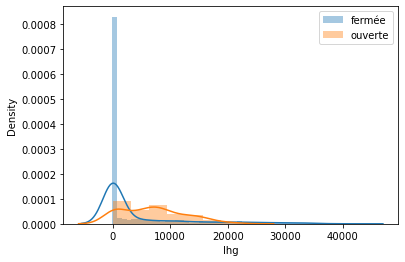

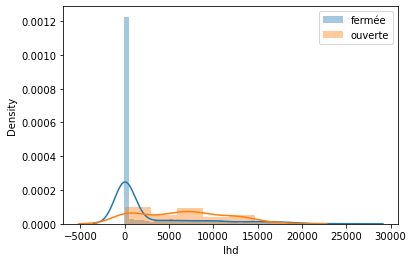

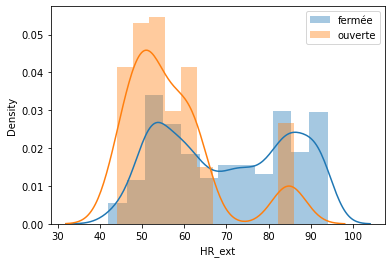

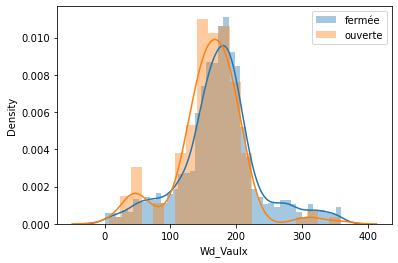

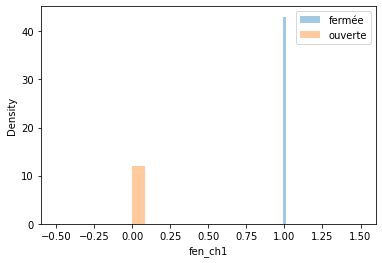

In [20]:
for col in df1.select_dtypes('float'):
    plt.figure()
    sns.distplot(f1_df[col],label='fermée')
    sns.distplot(o1_df[col],label='ouverte')
    plt.legend()
for col in df1.select_dtypes('int'):
    plt.figure()
    sns.distplot(f1_df[col],label='fermée')
    sns.distplot(o1_df[col],label='ouverte')
    plt.legend()

### Relation entre les mémes variables de la chambre 2,pendant la ferméture et l'ouverture des fenetres


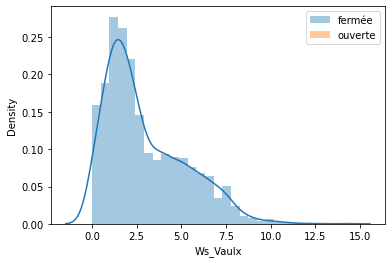

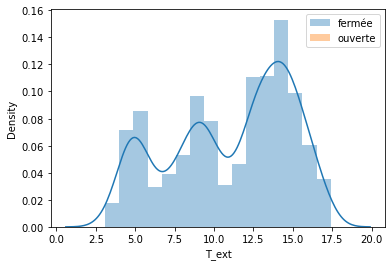

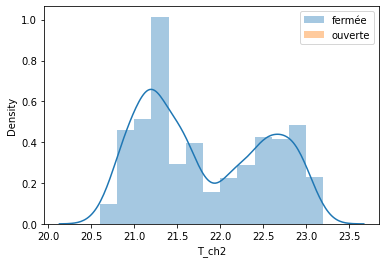

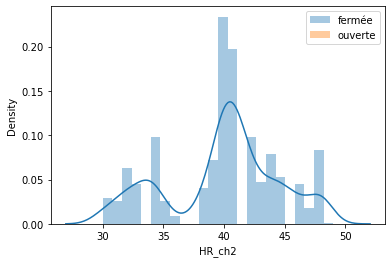

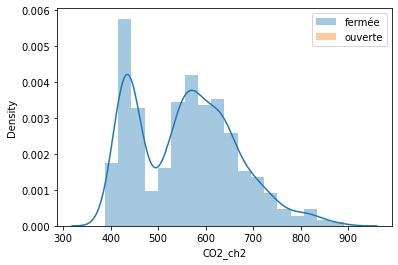

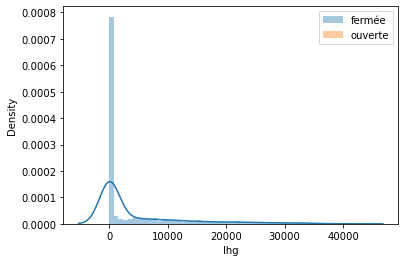

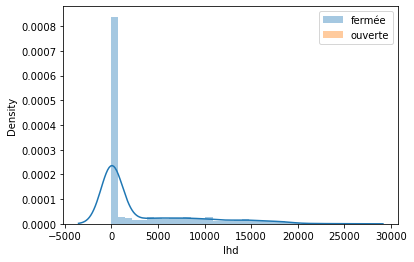

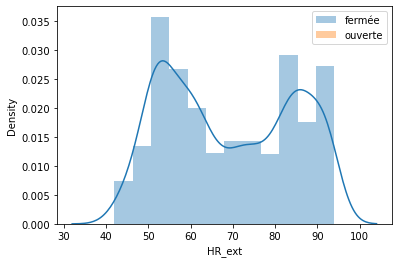

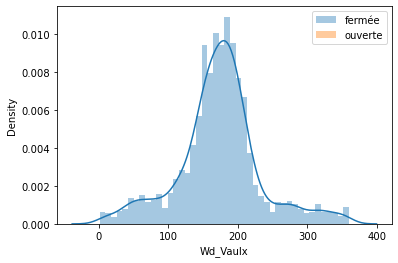

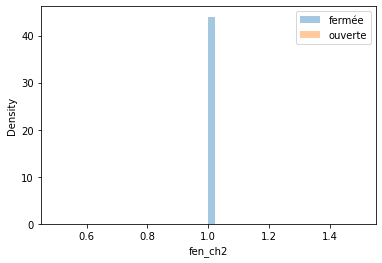

In [21]:
for col in df2.select_dtypes('float'):
    plt.figure()
    sns.distplot(f2_df[col],label='fermée')
    sns.distplot(o2_df[col],label='ouverte')
    #plt.title('Camp2N2')
    plt.legend()
for col in df2.select_dtypes('int'):
    plt.figure()
    sns.distplot(f2_df[col],label='fermée')
    sns.distplot(o2_df[col],label='ouverte')
    #plt.title('Camp2N2')
    plt.legend()

### Relation entre les mémes variables de la cuisine,pendant la ferméture et l'ouverture des fenetres

In [34]:
#plt.figure()
#sns.distplot(f_df['Ihg'],label='fermée')
#sns.distplot(o_df['Ihg'],label='ouverte')
#plt.legend()


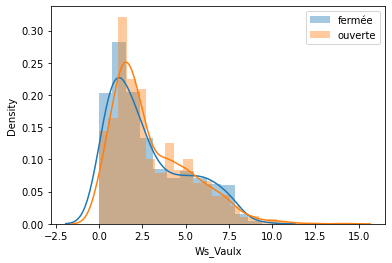

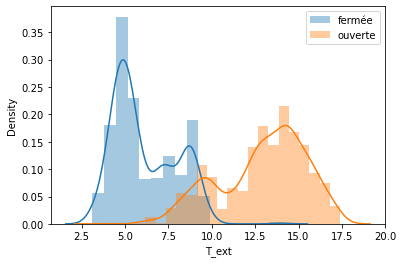

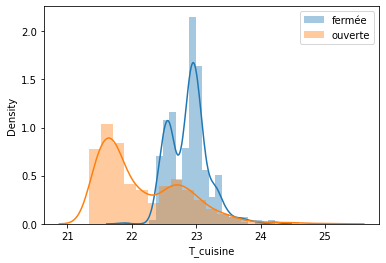

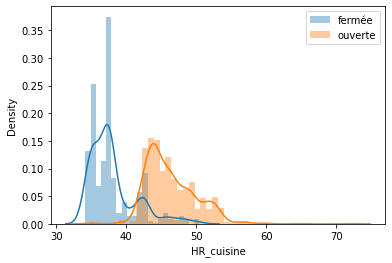

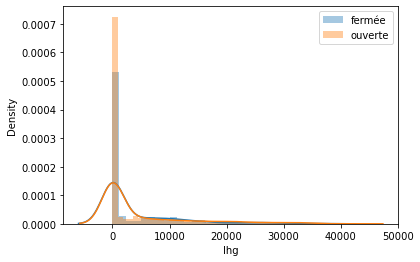

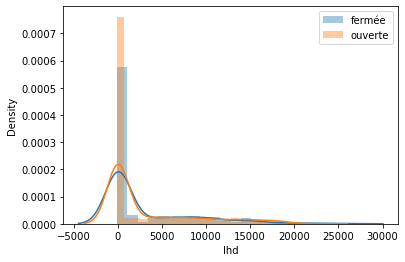

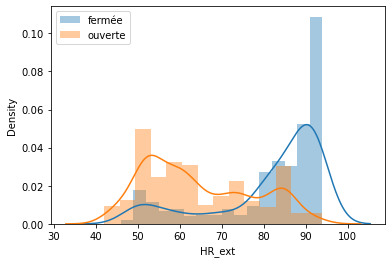

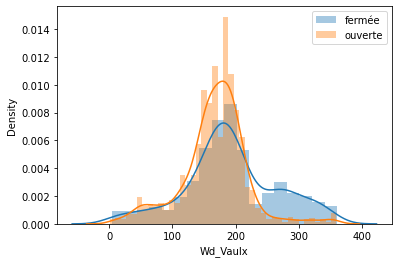

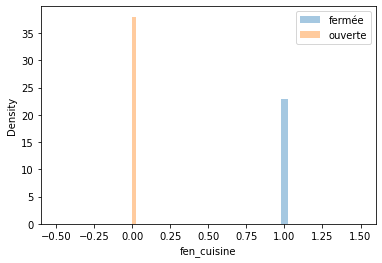

In [22]:
for col in dfc.select_dtypes('float'):
    plt.figure()
    sns.distplot(fc_df[col],label='fermée')
    sns.distplot(oc_df[col],label='ouverte')
    #plt.title('Camp2N2')
    plt.legend()
for col in dfc.select_dtypes('int'):
    plt.figure()
    sns.distplot(fc_df[col],label='fermée')
    sns.distplot(oc_df[col],label='ouverte')
    #plt.title('Camp2N2')
    plt.legend()
    

### Relation entre les mémes variables du salon ,pendant la ferméture et l'ouverture des fenetres 

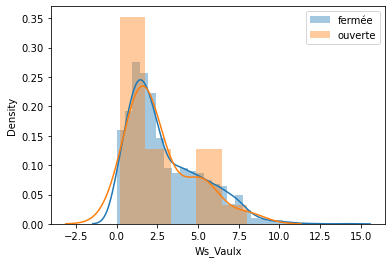

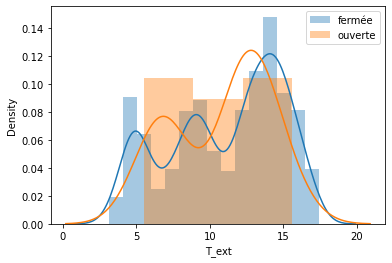

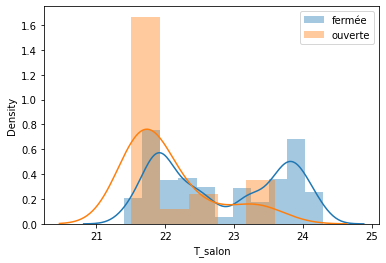

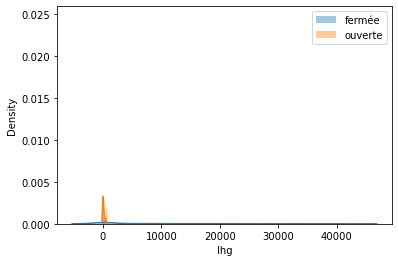

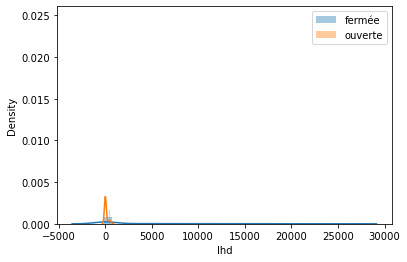

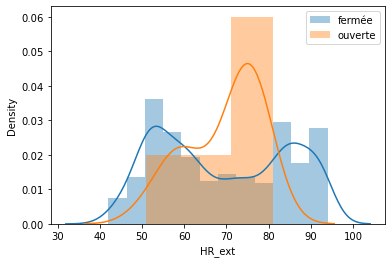

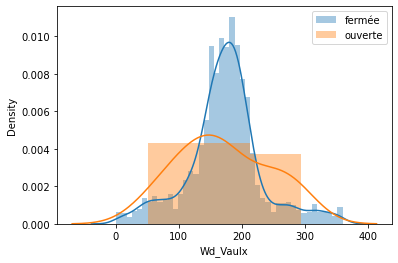

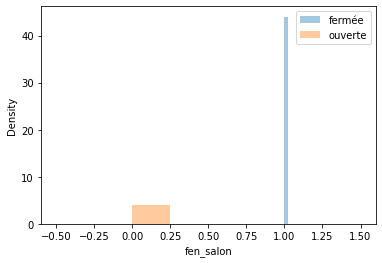

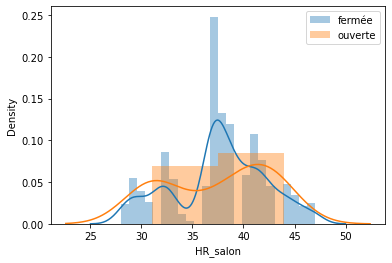

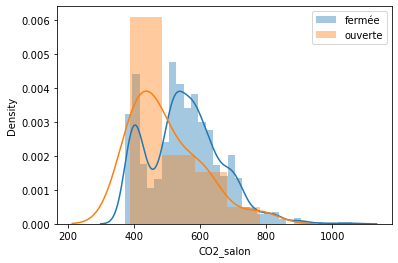

In [23]:
for col in dfs.select_dtypes('float'):
    plt.figure()
    sns.distplot(fs_df[col],label='fermée')
    sns.distplot(os_df[col],label='ouverte')
    #plt.title('Camp1N2')
    plt.legend()
for col in dfs.select_dtypes('int'):
    plt.figure()
    sns.distplot(fs_df[col],label='fermée')
    sns.distplot(os_df[col],label='ouverte')
    #plt.title('Camp1N2')
    plt.legend()    

## Matrice de corrélation pour chaque fenetre 

Chambre 1 

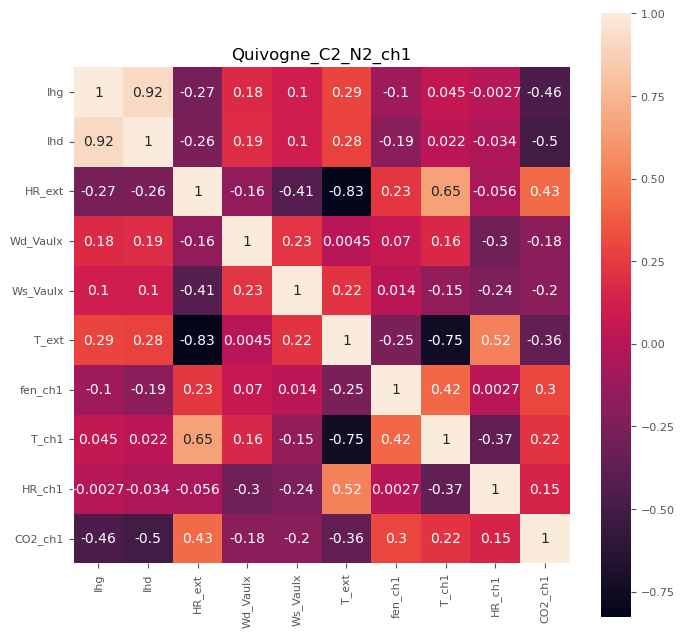

In [44]:

plt.subplots(figsize=(8,8))
sns.heatmap(df1.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('Quivogne_C2_N2_ch1')
plt.show()

Chambre 2 

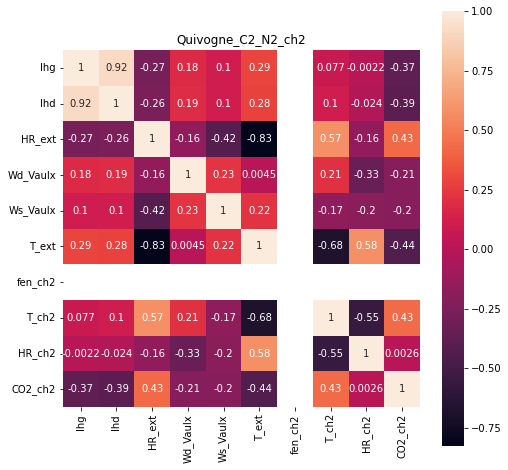

In [28]:
plt.subplots(figsize=(8,8))
sns.heatmap(df2.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('Quivogne_C2_N2_ch2')
plt.show()

Cuisine

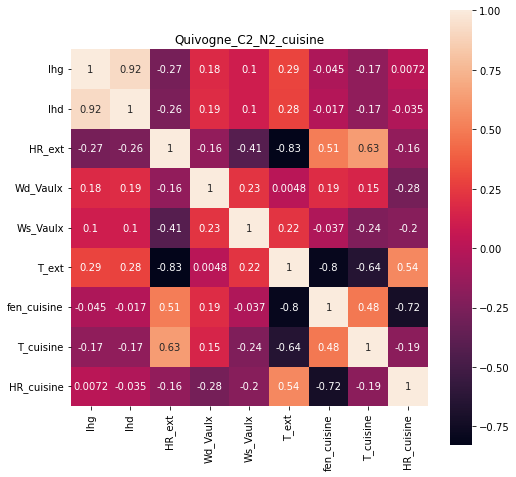

In [29]:
plt.subplots(figsize=(8,8))
sns.heatmap(dfc.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('Quivogne_C2_N2_cuisine')
plt.show()

Salon

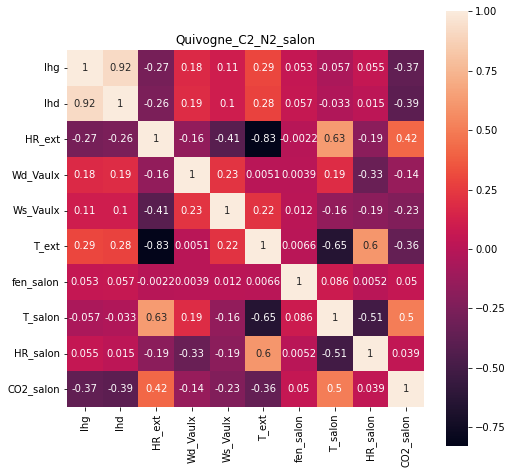

In [30]:
plt.subplots(figsize=(8,8))
sns.heatmap(dfs.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('Quivogne_C2_N2_salon')
plt.show()

Chambre 1 

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

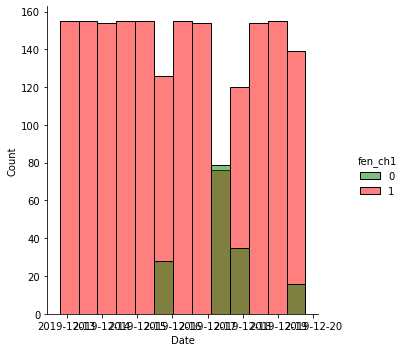

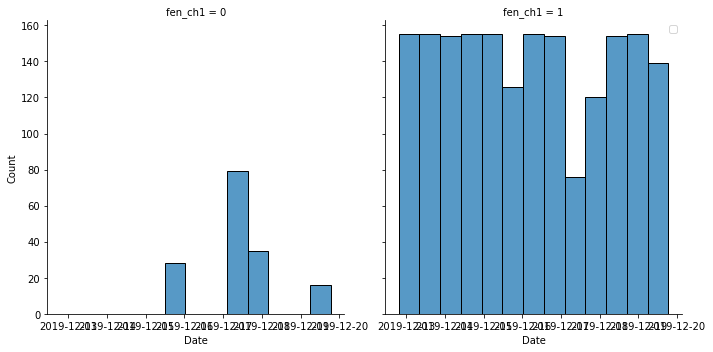

<Figure size 432x288 with 0 Axes>

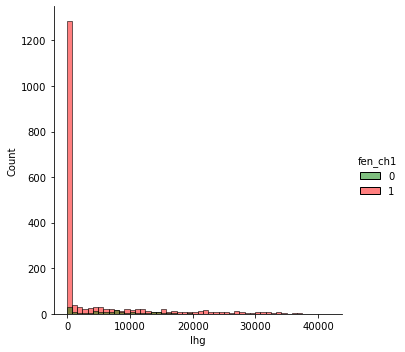

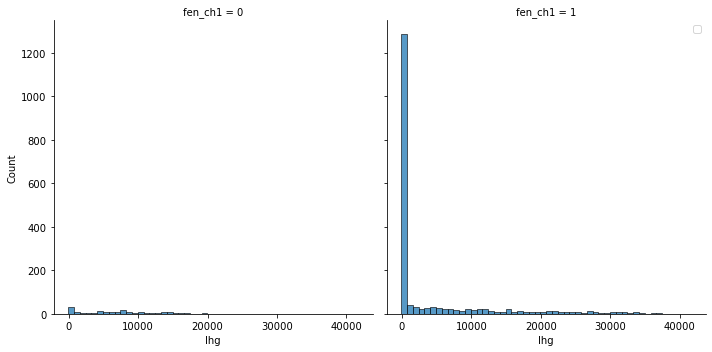

<Figure size 432x288 with 0 Axes>

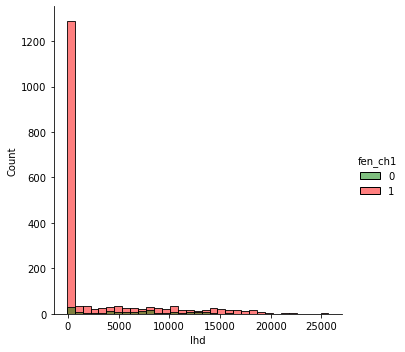

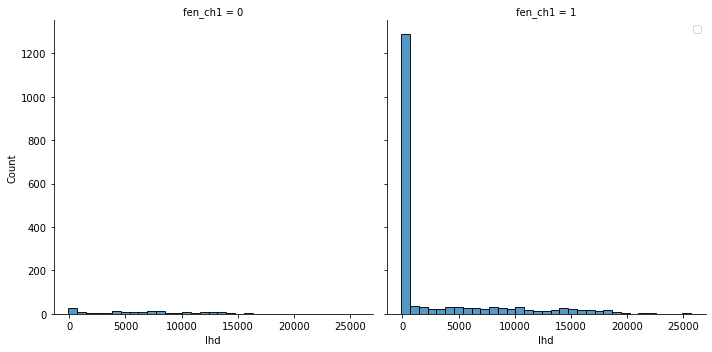

<Figure size 432x288 with 0 Axes>

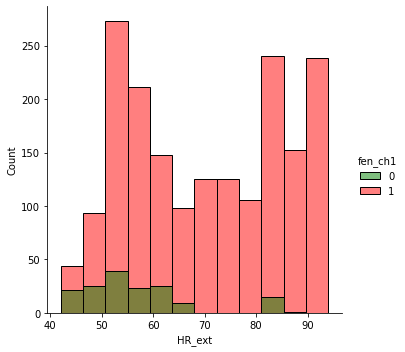

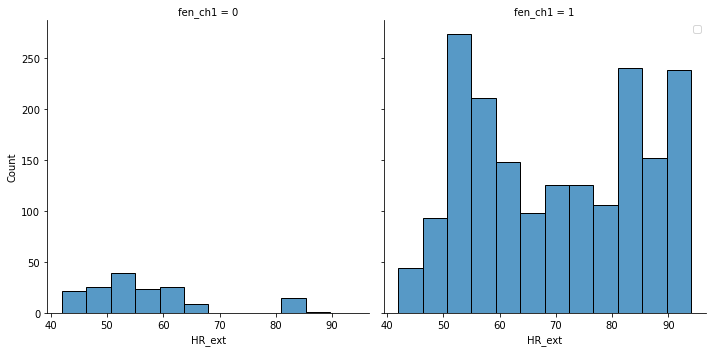

<Figure size 432x288 with 0 Axes>

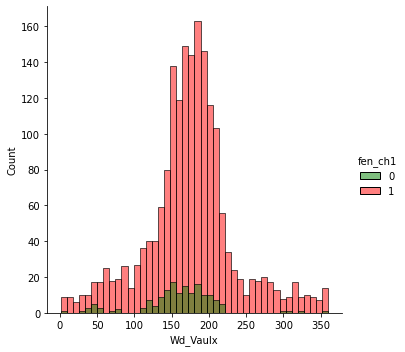

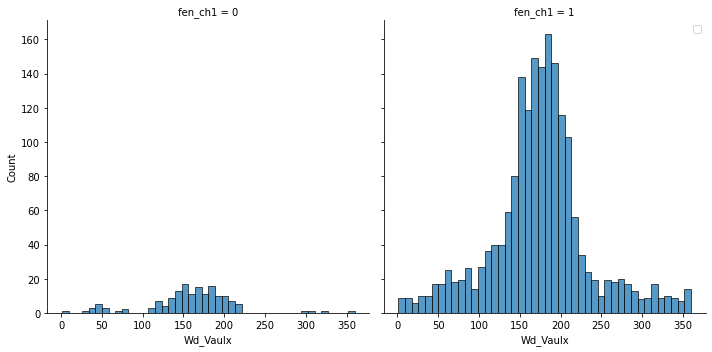

<Figure size 432x288 with 0 Axes>

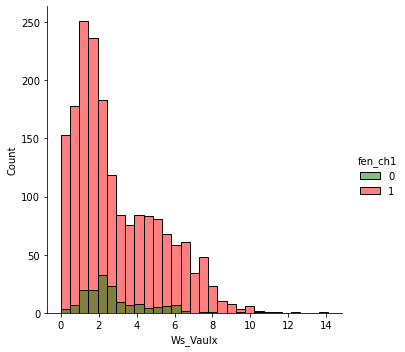

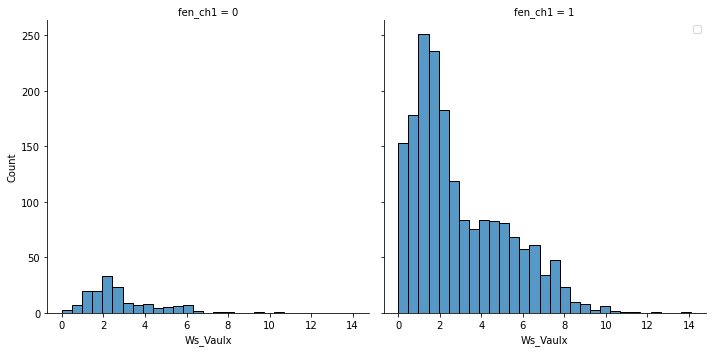

<Figure size 432x288 with 0 Axes>

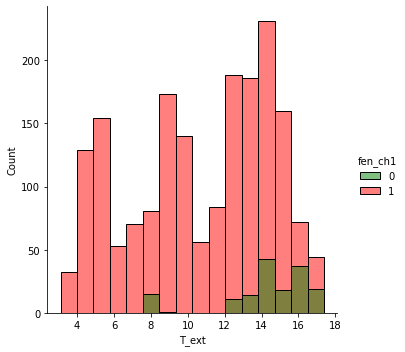

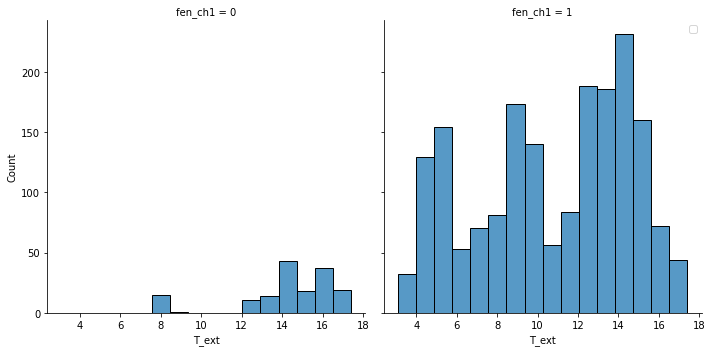

<Figure size 432x288 with 0 Axes>

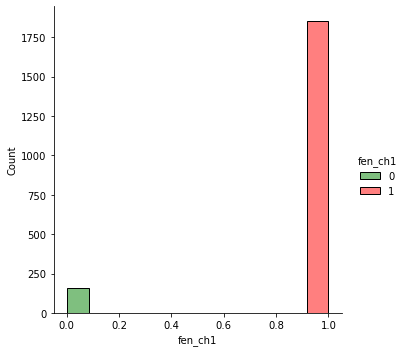

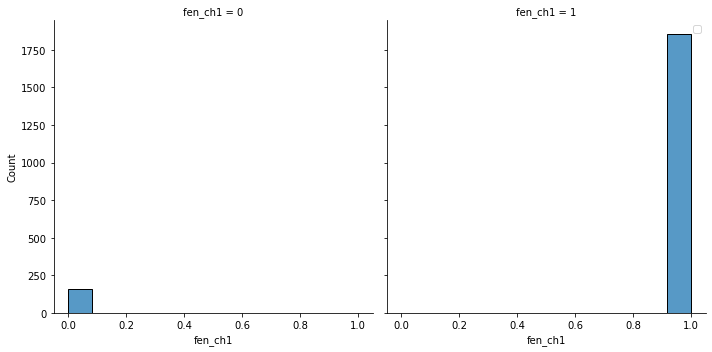

<Figure size 432x288 with 0 Axes>

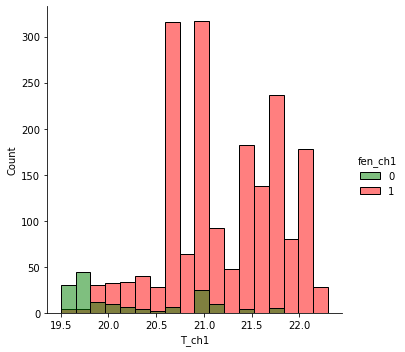

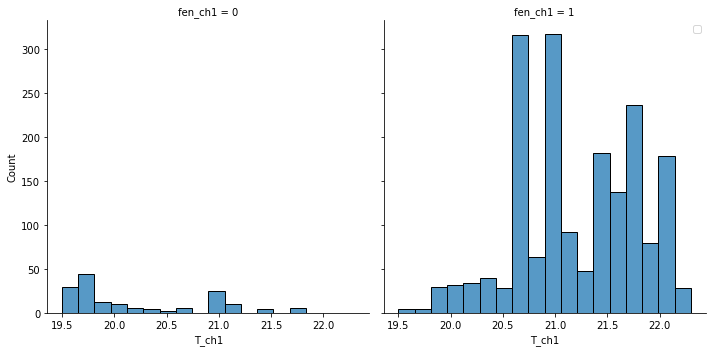

<Figure size 432x288 with 0 Axes>

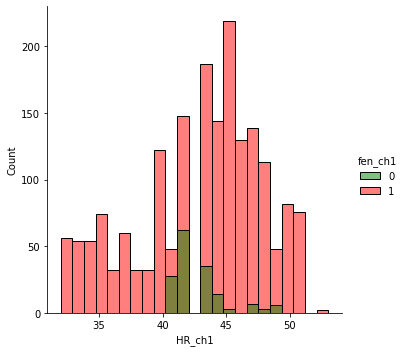

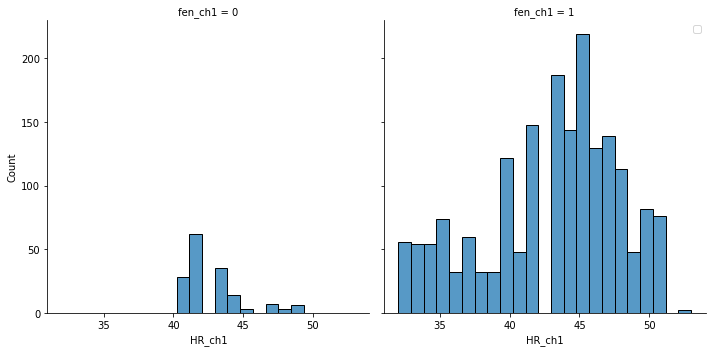

<Figure size 432x288 with 0 Axes>

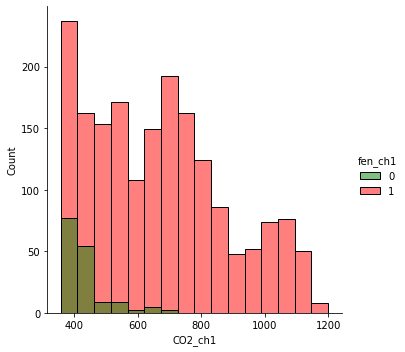

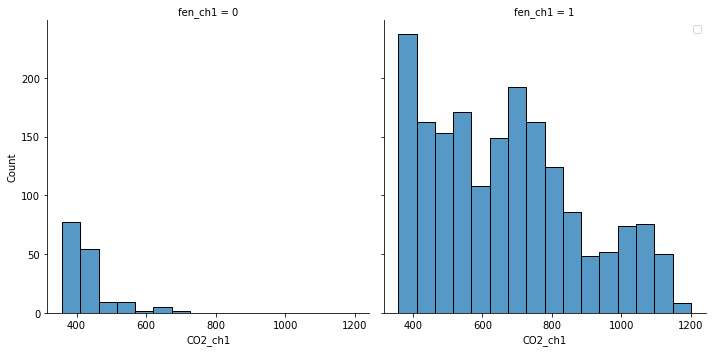

In [31]:
for col in df1:
    plt.figure()
    sns.displot(data=df1,x=col,hue="fen_ch1",palette=["g","r"])
    sns.displot(data=df1,x=col,col="fen_ch1",palette=["g","r"])
    plt.legend()

Chambre 2

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

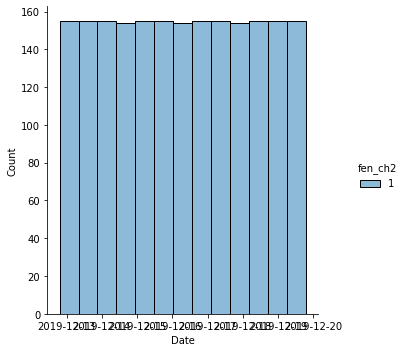

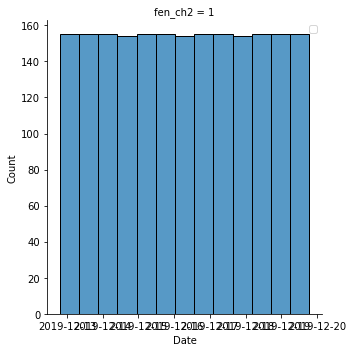

<Figure size 432x288 with 0 Axes>

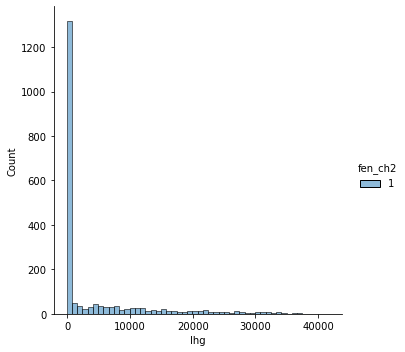

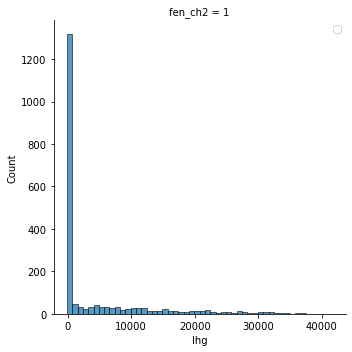

<Figure size 432x288 with 0 Axes>

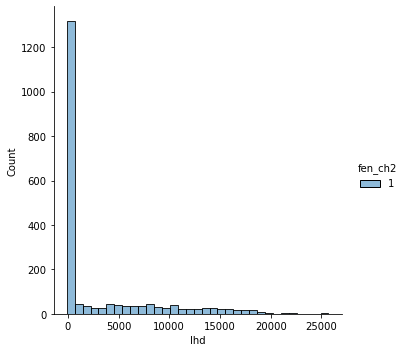

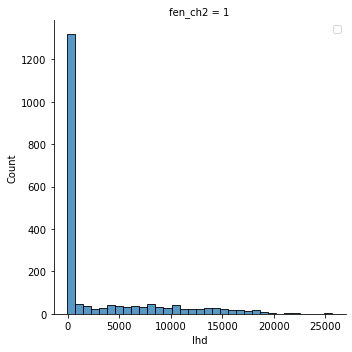

<Figure size 432x288 with 0 Axes>

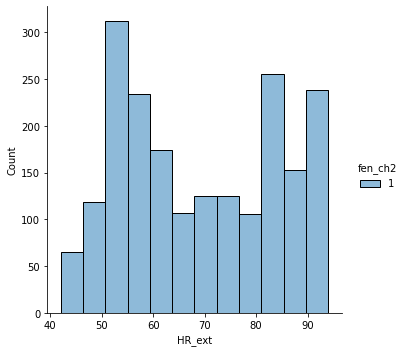

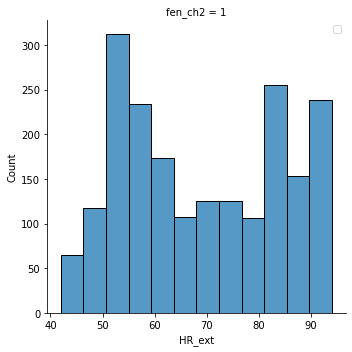

<Figure size 432x288 with 0 Axes>

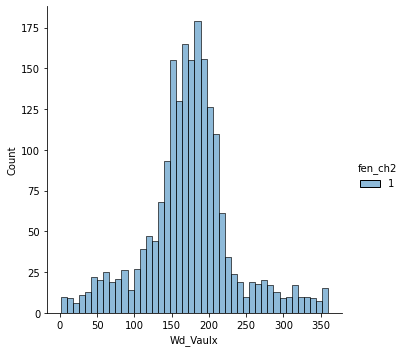

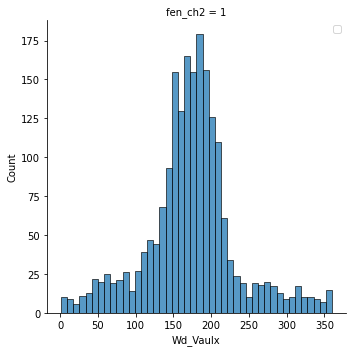

<Figure size 432x288 with 0 Axes>

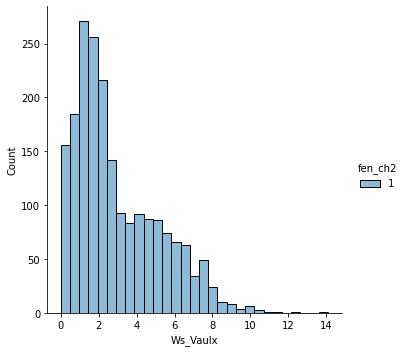

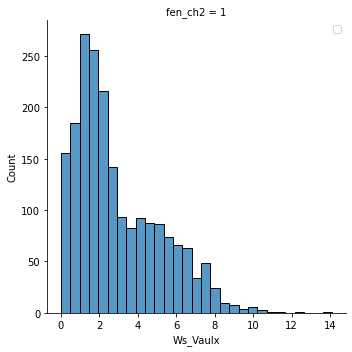

<Figure size 432x288 with 0 Axes>

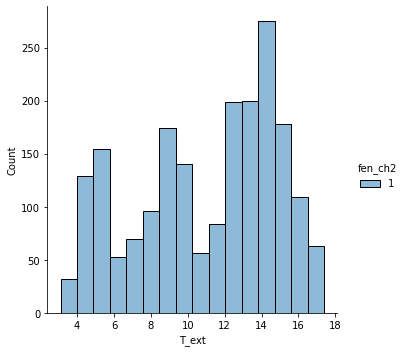

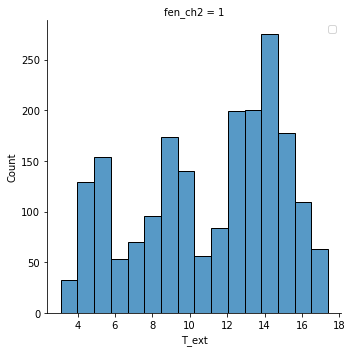

<Figure size 432x288 with 0 Axes>

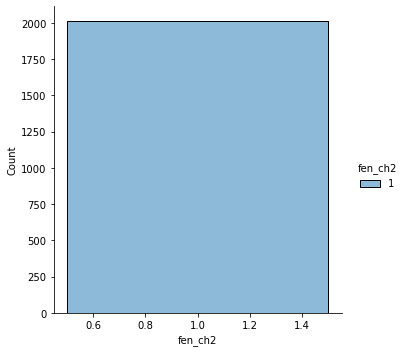

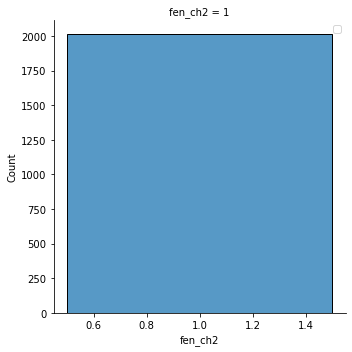

<Figure size 432x288 with 0 Axes>

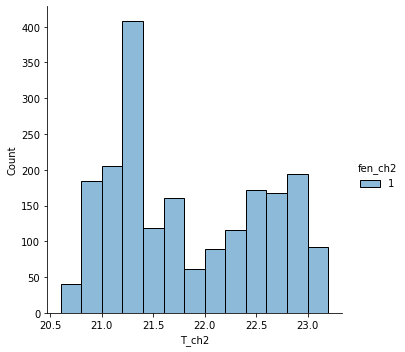

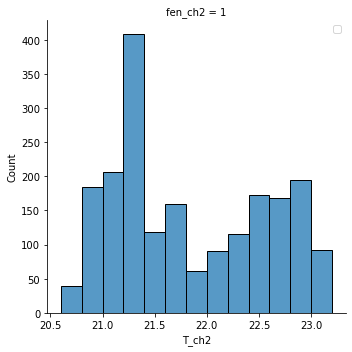

<Figure size 432x288 with 0 Axes>

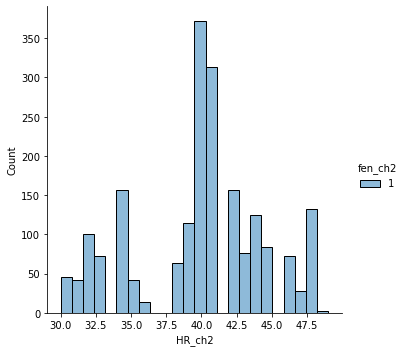

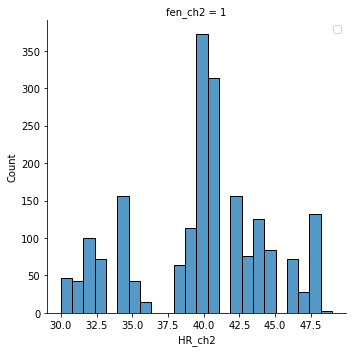

<Figure size 432x288 with 0 Axes>

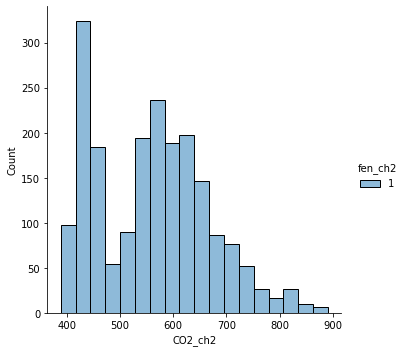

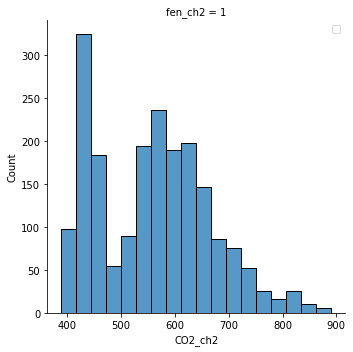

In [61]:
for col in df2:
    plt.figure()
    sns.displot(data=df2,x=col,hue="fen_ch2")
    sns.displot(data=df2,x=col,col="fen_ch2")
    plt.legend()
#sns.displot(data=df,x="HR_ext",hue="fen_ch1",palette=["g","r"])


Cuisine

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

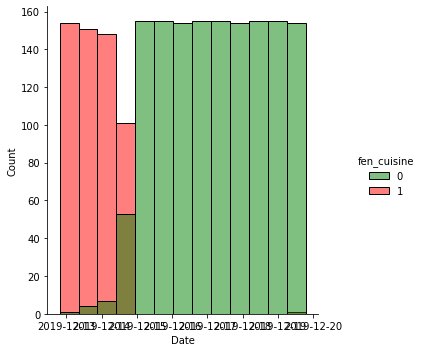

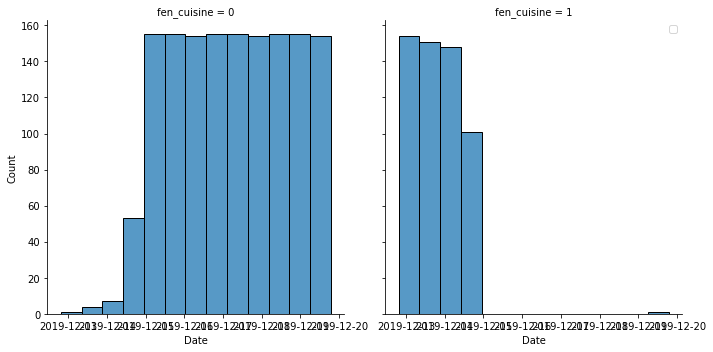

<Figure size 432x288 with 0 Axes>

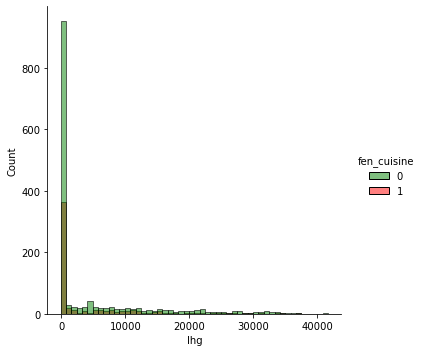

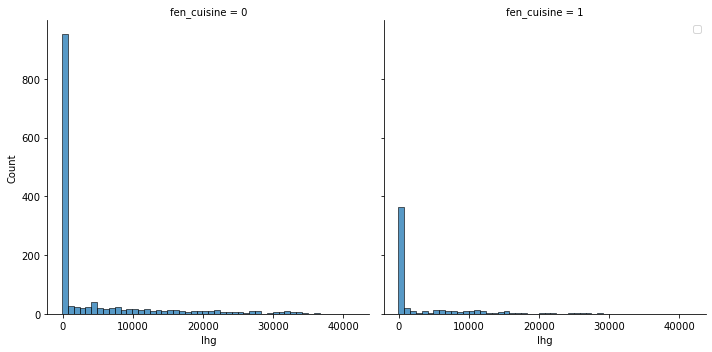

<Figure size 432x288 with 0 Axes>

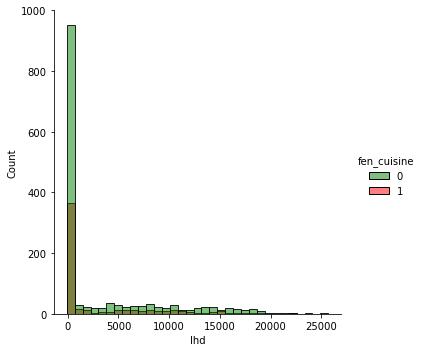

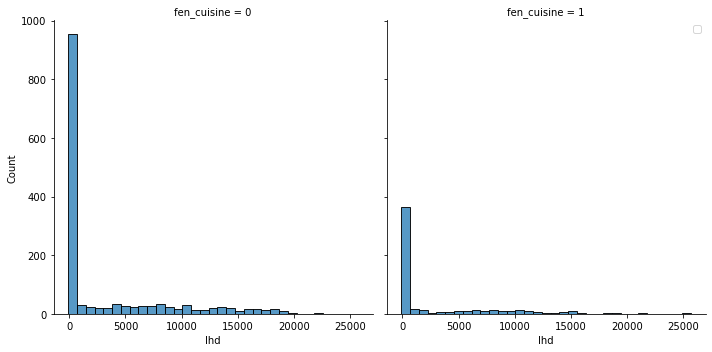

<Figure size 432x288 with 0 Axes>

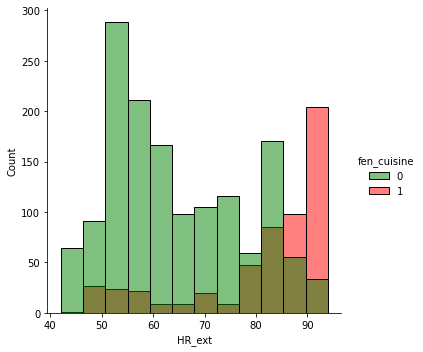

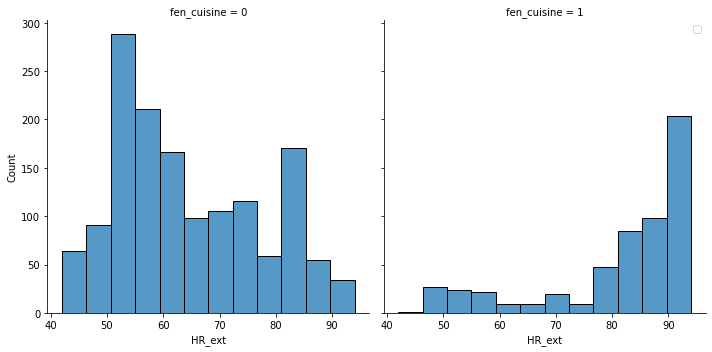

<Figure size 432x288 with 0 Axes>

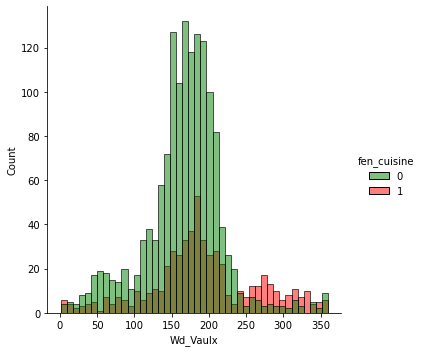

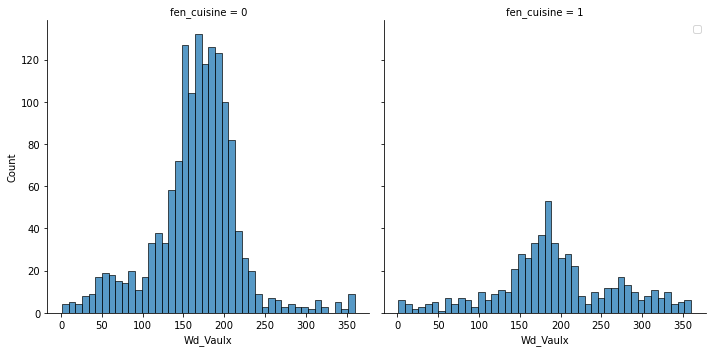

<Figure size 432x288 with 0 Axes>

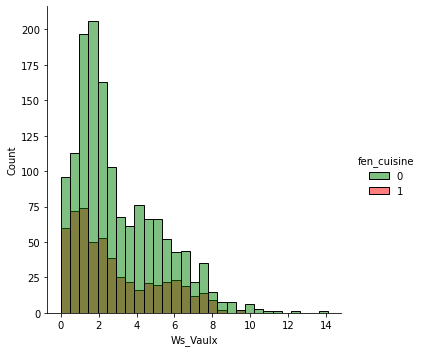

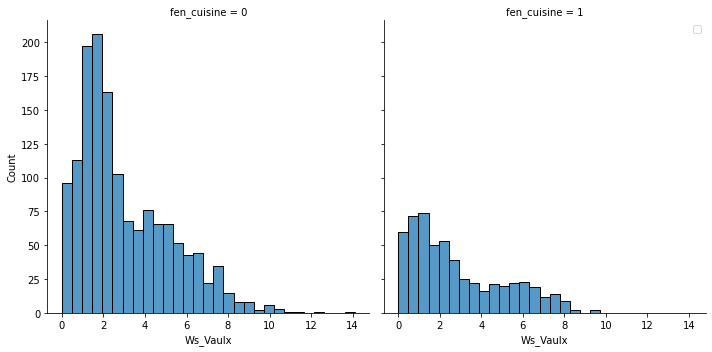

<Figure size 432x288 with 0 Axes>

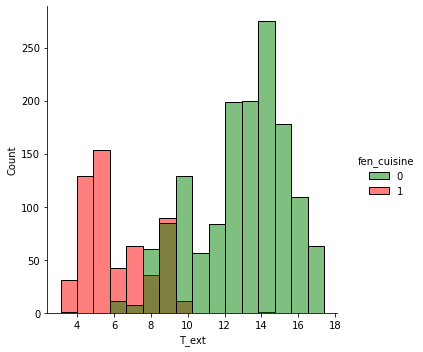

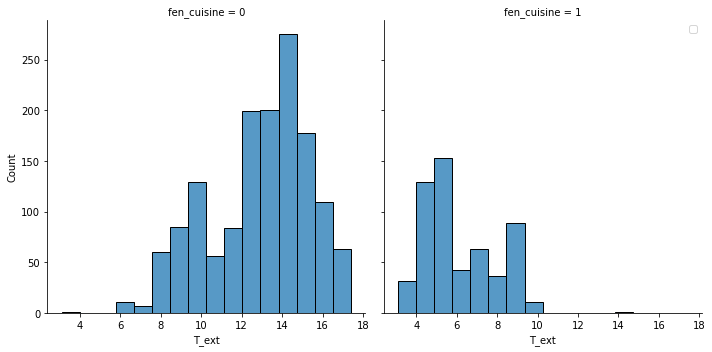

<Figure size 432x288 with 0 Axes>

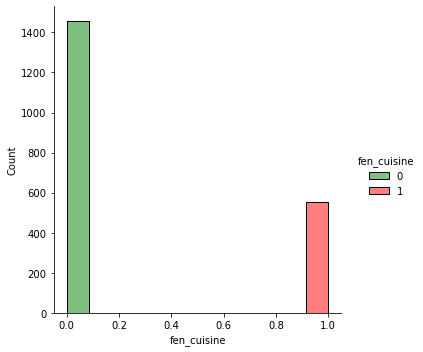

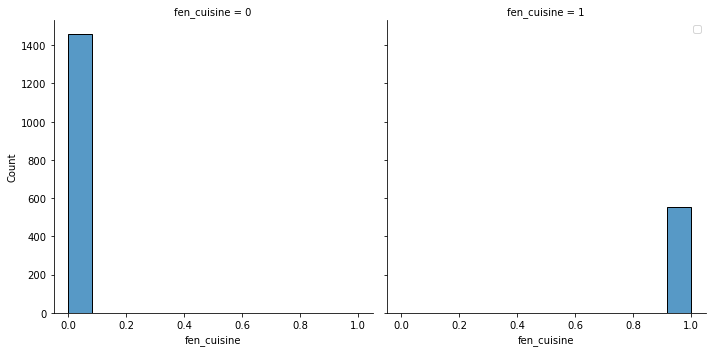

<Figure size 432x288 with 0 Axes>

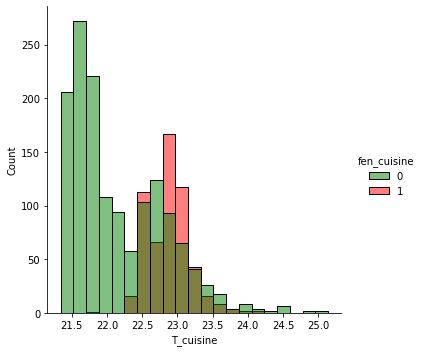

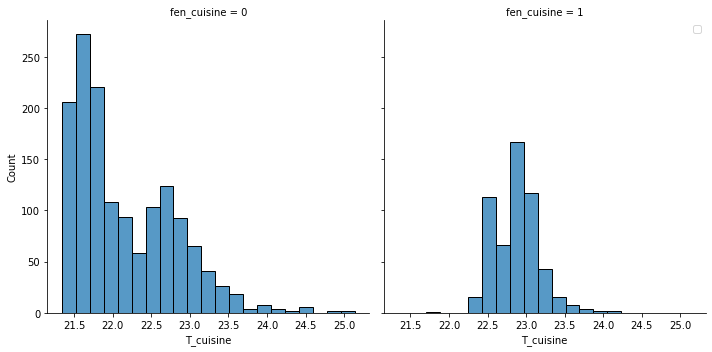

<Figure size 432x288 with 0 Axes>

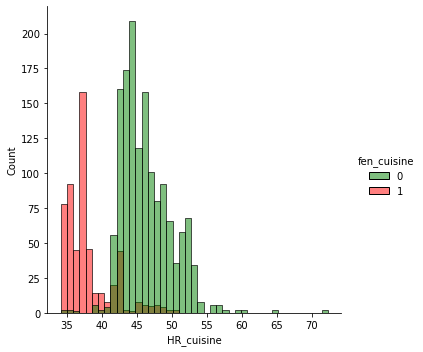

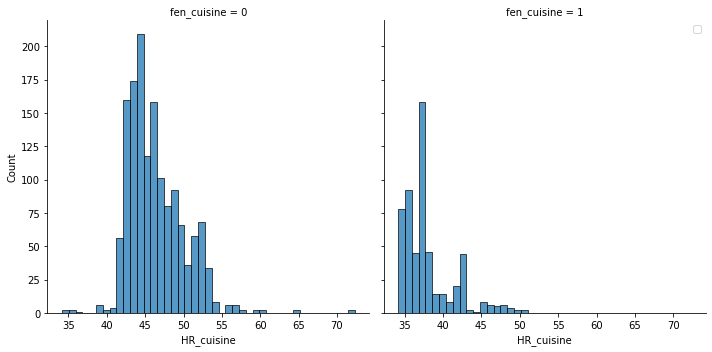

In [62]:
for col in dfc:
    plt.figure()
    sns.displot(data=dfc,x=col,hue="fen_cuisine",palette=["g","r"])
    sns.displot(data=dfc,x=col,col="fen_cuisine",palette=["g","r"])
    plt.legend()

Salon

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

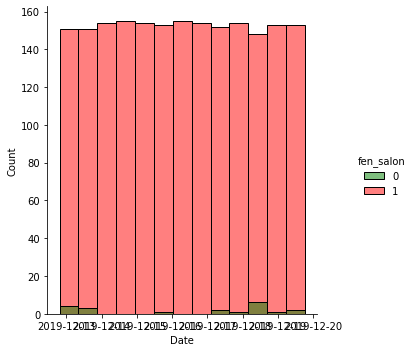

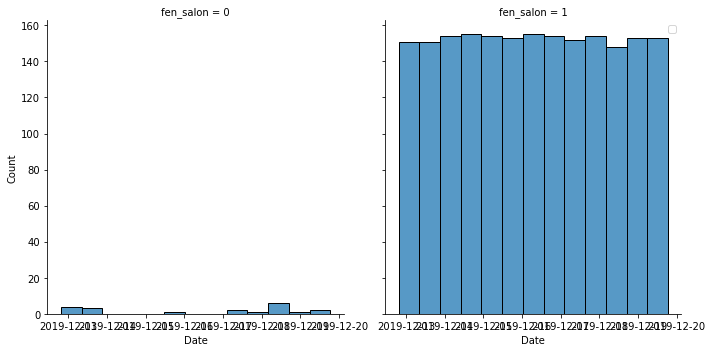

<Figure size 432x288 with 0 Axes>

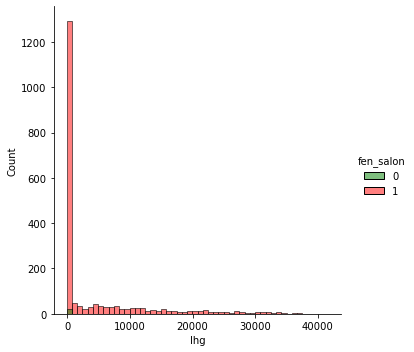

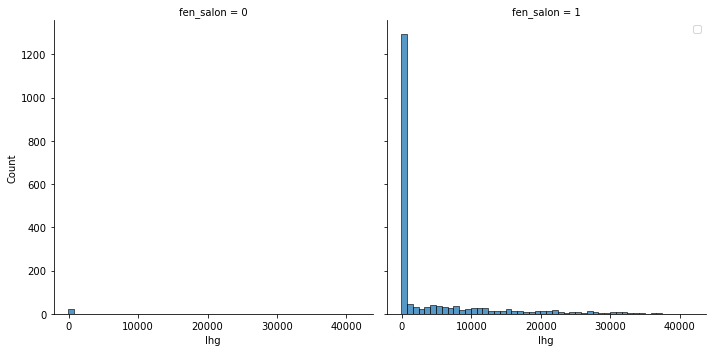

<Figure size 432x288 with 0 Axes>

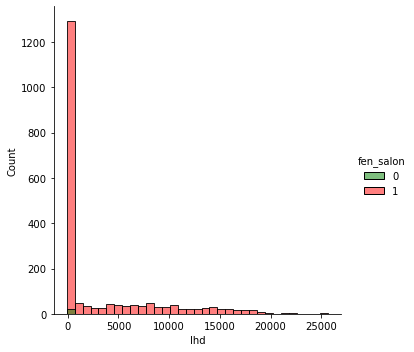

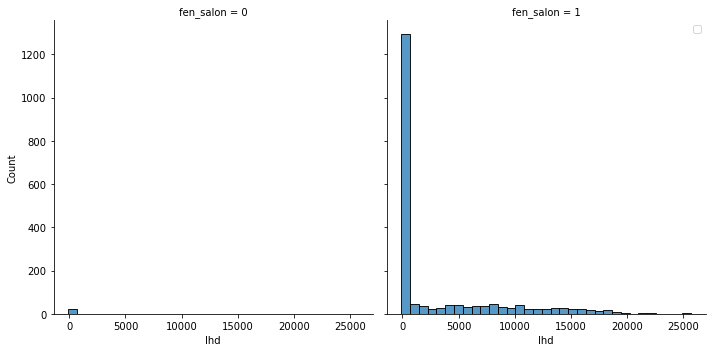

<Figure size 432x288 with 0 Axes>

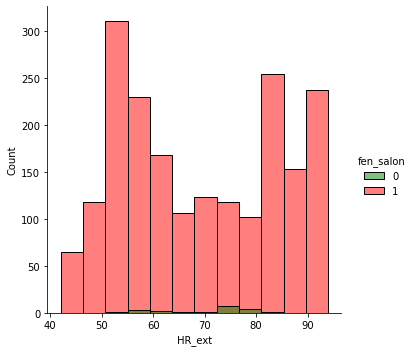

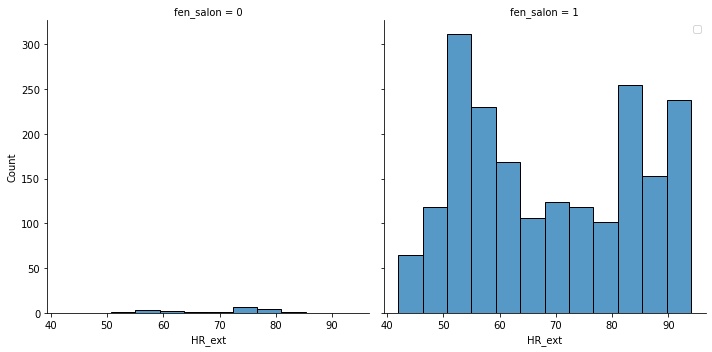

<Figure size 432x288 with 0 Axes>

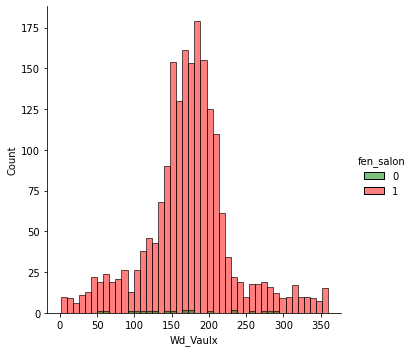

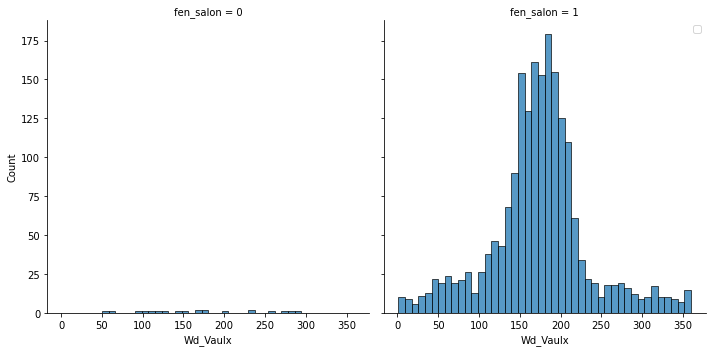

<Figure size 432x288 with 0 Axes>

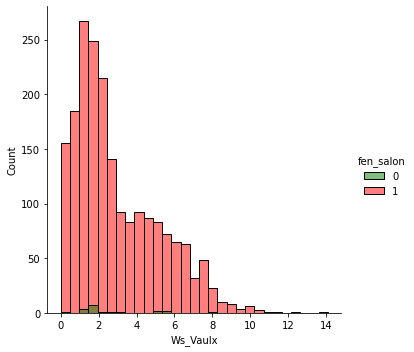

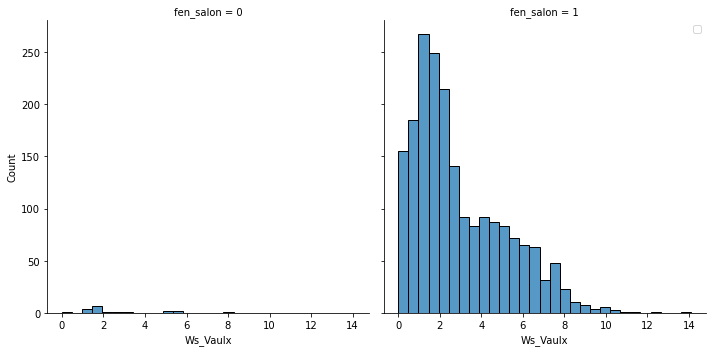

<Figure size 432x288 with 0 Axes>

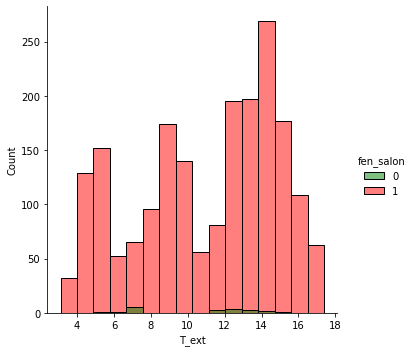

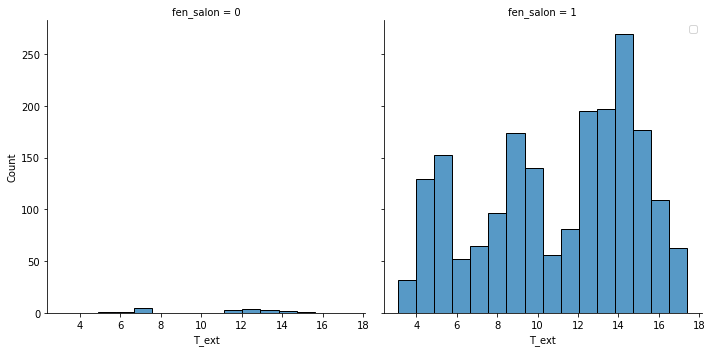

<Figure size 432x288 with 0 Axes>

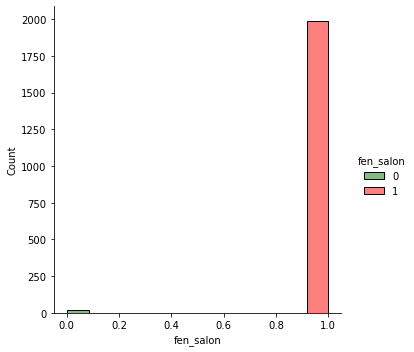

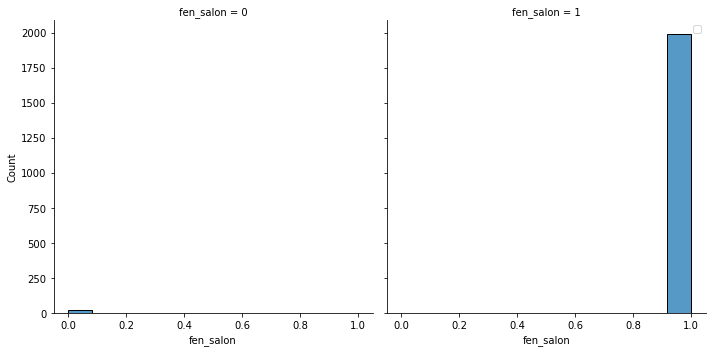

<Figure size 432x288 with 0 Axes>

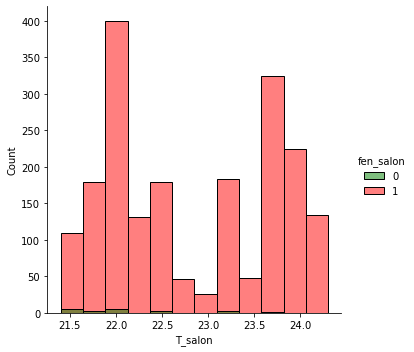

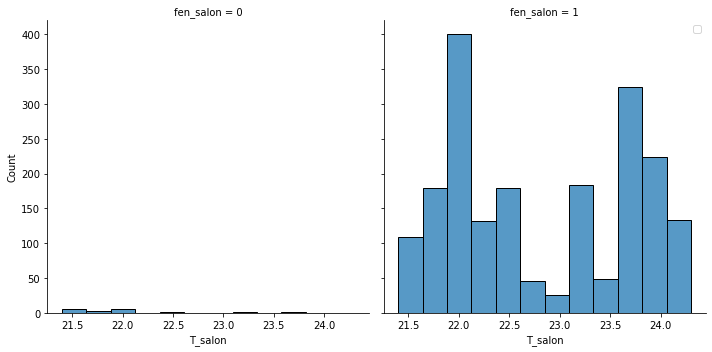

<Figure size 432x288 with 0 Axes>

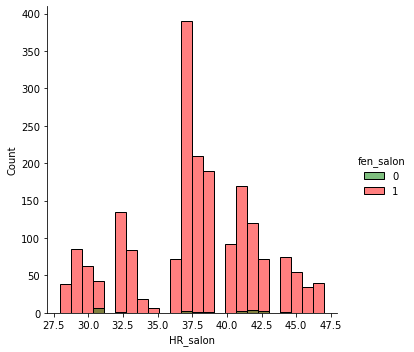

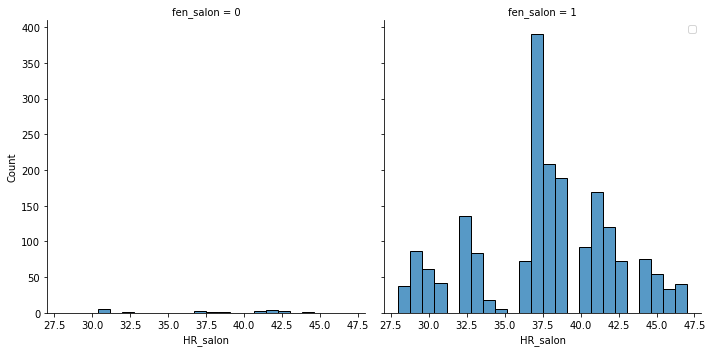

<Figure size 432x288 with 0 Axes>

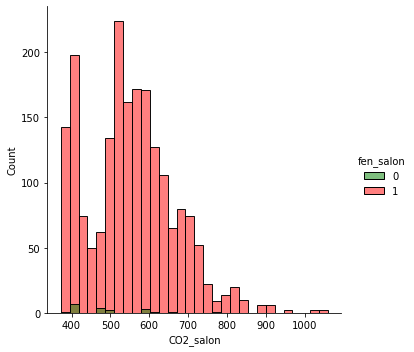

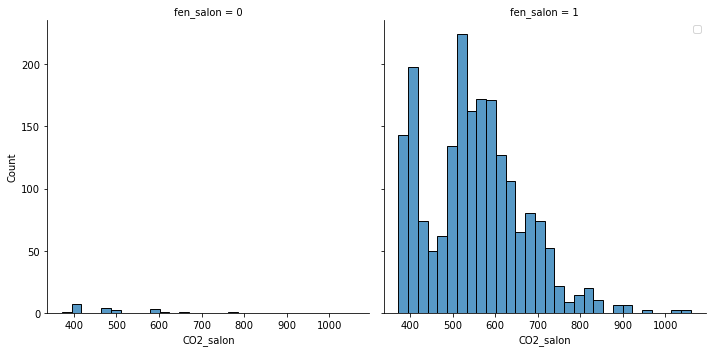

In [64]:
for col in dfs:
    plt.figure()
    sns.displot(data=dfs,x=col,hue="fen_salon",palette=["g","r"])
    sns.displot(data=dfs,x=col,col="fen_salon",palette=["g","r"])
    plt.legend()

## Visualisation des relations entre différentes variables 

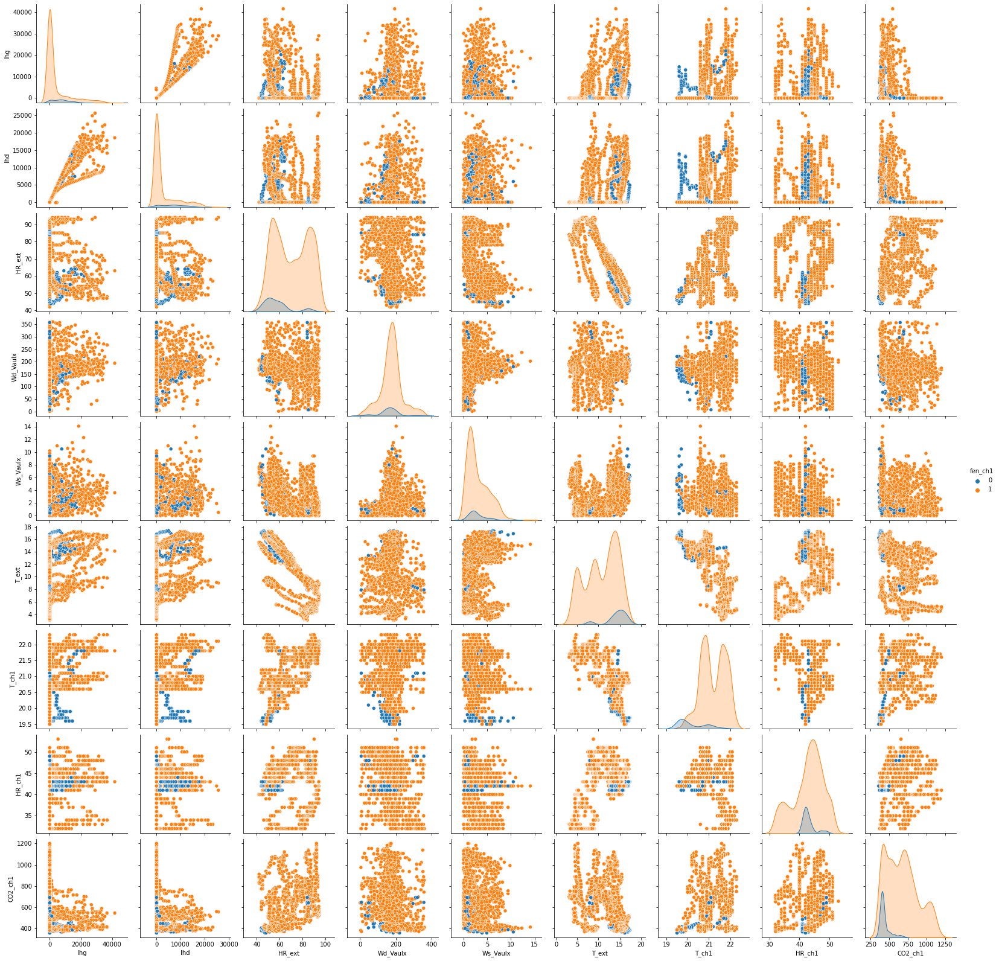

In [32]:
#sns.set_theme(style="ticks")
#CHAMBRE 1 µ
sns.pairplot(df1, hue="fen_ch1")

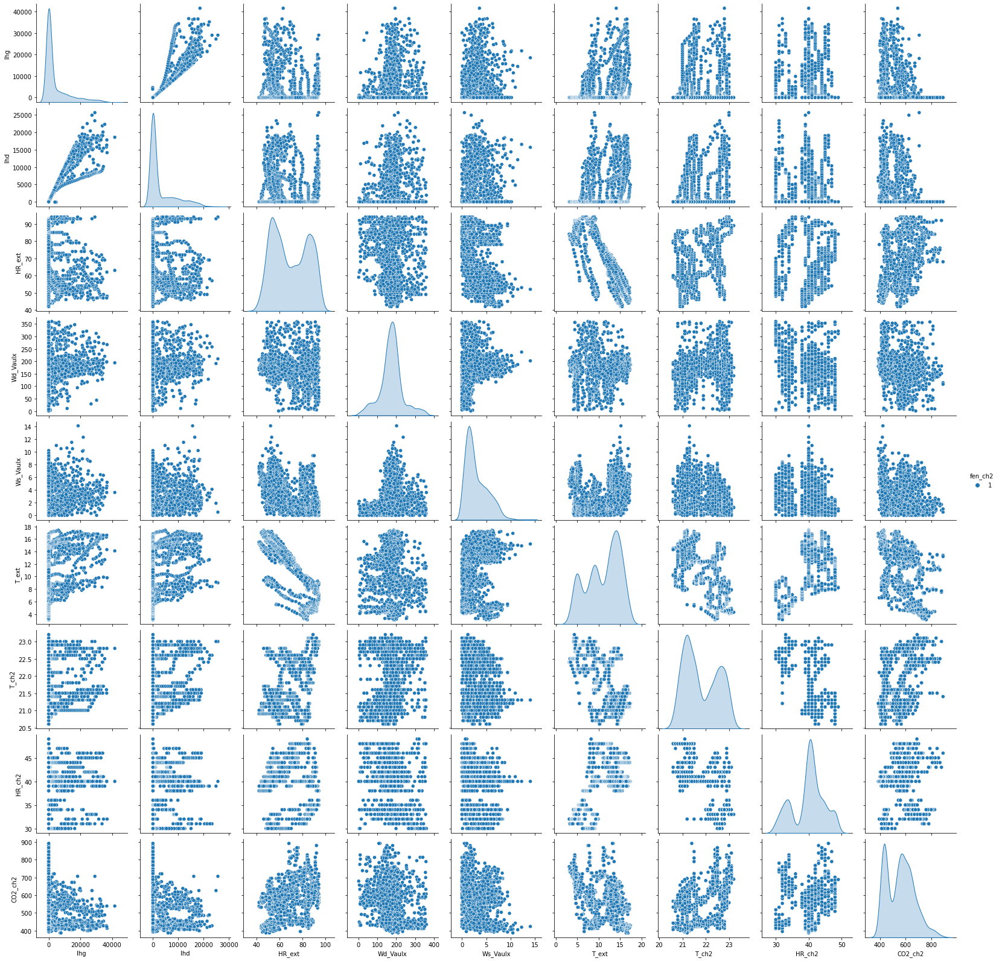

In [33]:
#CHAMBRE 2
sns.pairplot(df2, hue="fen_ch2")

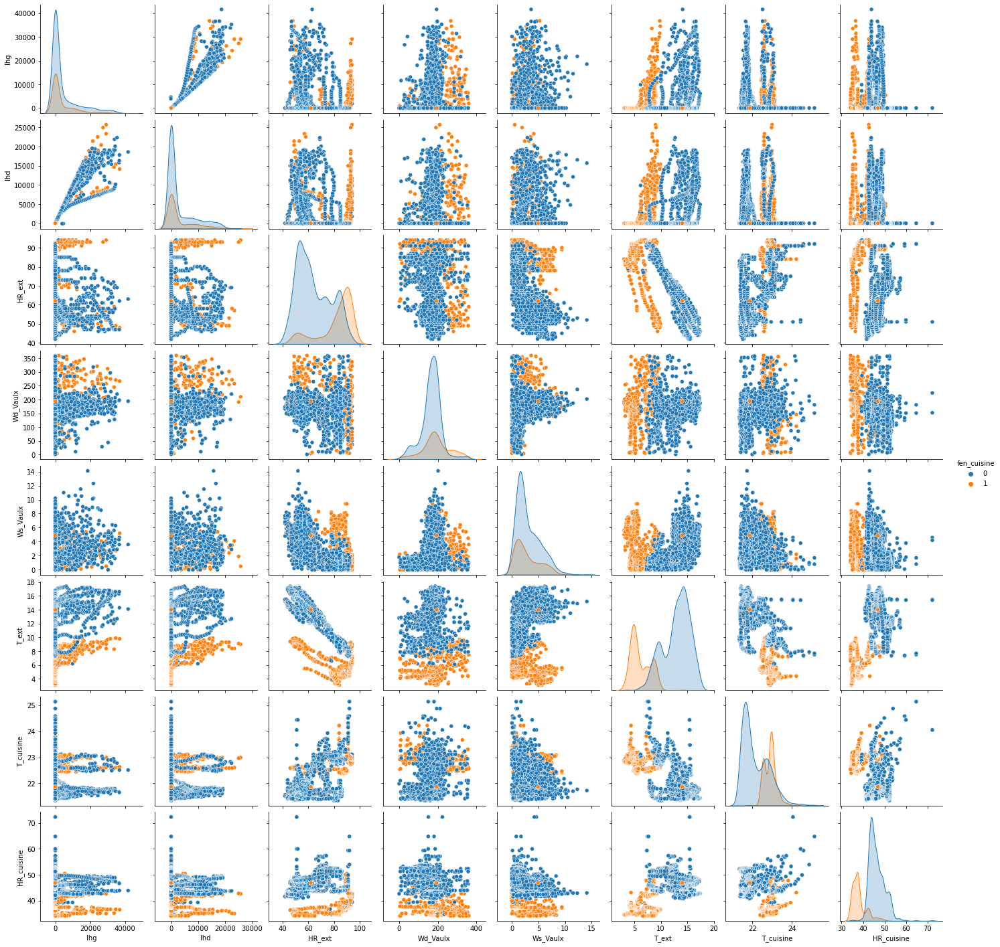

In [34]:
#CUISINE
sns.pairplot(dfc, hue="fen_cuisine")

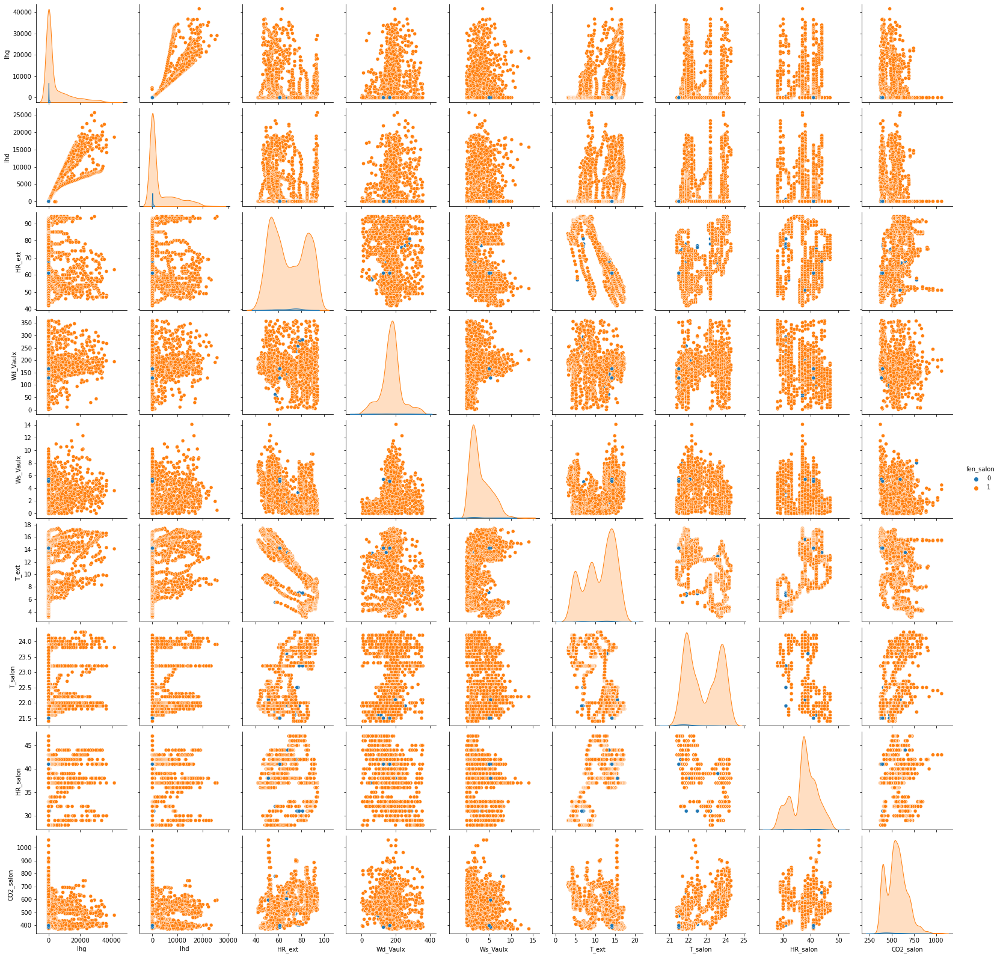

In [35]:
#SALON
sns.pairplot(dfs, hue="fen_salon")

In [45]:
#from pandas_profiling import ProfileReport 

In [46]:
#profile = ProfileReport(df,title='statistique_Donnees_Quivogne_Camp2N2_fen_ch1_all_avec_meteo')

In [50]:
#profile.to_file('statistique_Donnees_Quivogne_Camp2N2_fen_ch1_all_avec_meteo.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Rapport sous format HTML

In [37]:
import sweetviz as sv
rapport_Quivogne_camp2_N2_ch1=sv.analyze(df1) 
rapport_Quivogne_camp2_N2_ch1.show_html()
 

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [38]:
rapport_Quivogne_camp2_N2_ch2=sv.analyze(df2) 
rapport_Quivogne_camp2_N2_ch2.show_html()
 

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [39]:
rapport_Quivogne_camp2_N2_cuisine=sv.analyze(dfc) 
rapport_Quivogne_camp2_N2_cuisine.show_html()
 

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [40]:
rapport_Quivogne_camp2_N2_s=sv.analyze(dfs) 
rapport_Quivogne_camp2_N2_s.show_html()
 

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [41]:
import dtale 
df

,fen_ch1,T_ch1,HR_ch1,CO2_ch1,fen_ch2,T_ch2,HR_ch2,CO2_ch2,fen_cuisine,T_cuisine,HR_cuisine,fen_salon,T_salon,HR_salon,CO2_salon
Date,,,,,,,,,,,,,,,
2019-12-12 19:20:00,1.0,20.6,33.0,632.0,1.0,21.2,32.0,694.0,1.0,22.393,34.484,0.0,21.7,32.0,780.0
2019-12-12 19:25:00,1.0,20.6,33.0,632.0,1.0,21.2,32.0,694.0,1.0,22.393,34.484,1.0,21.7,32.0,780.0
2019-12-12 19:30:00,1.0,20.9,32.0,685.0,1.0,21.5,32.0,717.0,1.0,22.729,34.648,1.0,22.5,31.0,703.0
2019-12-12 19:35:00,1.0,20.9,32.0,685.0,1.0,21.5,32.0,717.0,1.0,22.729,34.648,1.0,22.5,31.0,703.0
2019-12-12 19:40:00,1.0,21.2,32.0,651.0,1.0,21.8,32.0,724.0,1.0,23.088,36.403,1.0,22.9,30.0,701.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-19 18:10:00,1.0,20.5,44.0,405.0,1.0,20.6,42.0,407.0,0.0,21.413,45.992,1.0,21.5,41.0,406.0
2019-12-19 18:15:00,1.0,20.5,44.0,405.0,1.0,20.6,42.0,407.0,0.0,21.413,45.992,1.0,21.5,41.0,406.0
2019-12-19 18:20:00,1.0,20.5,45.0,421.0,1.0,20.8,43.0,482.0,0.0,21.557,46.361,1.0,21.5,41.0,386.0


In [42]:
dfqn2 = dtale.show(df)
dfqn2

In [14]:
pd.to_datetime(df1['Date'], format='%m/%d/%y')
df1=df1.set_index('Date')
df1_avec_date=df1.copy()
#df1=df1.loc['date début':'date fin']# si ya une anomalie dans les données en peu selection les dates quand veu prendre 
df1_avec_date['jour'] = df1_avec_date.index.weekday#day_name()
df1_avec_date['heure'] = df1_avec_date.index.hour
df1_avec_date['mois'] = df1_avec_date.index.month
#df1['nom de la journé']=df1.index.day_name()

#================== Chambre 2 ====================#

pd.to_datetime(df2['Date'], format='%m/%d/%y')
df2=df2.set_index('Date')
df2_avec_date=df2.copy()
#df2=df2.loc['2018-12-12 19:00:00':'2019-03-24 12:00:00']
df2_avec_date['jour'] = df2_avec_date.index.weekday#day_name()
df2_avec_date['heure'] = df2_avec_date.index.hour
df2_avec_date['mois'] = df2_avec_date.index.month

#=================== Cuisine =====================#

pd.to_datetime(dfc['Date'], format='%m/%d/%y')
dfc=dfc.set_index('Date')
dfc_avec_date=dfc.copy()
#dfc=dfc.loc['':'']
dfc_avec_date['jour'] = dfc_avec_date.index.weekday#day_name()
dfc_avec_date['heure'] = dfc_avec_date.index.hour
dfc_avec_date['mois'] = dfc_avec_date.index.month
#==================== salon ======================#

pd.to_datetime(dfs['Date'], format='%m/%d/%y')
dfs=dfs.set_index('Date')
dfs_avec_date=dfs.copy()
#dfs=dfs.loc['':'']
dfs_avec_date['jour'] = dfs_avec_date.index.weekday#day_name()
dfs_avec_date['heure'] = dfs_avec_date.index.hour
dfs_avec_date['mois'] = dfs_avec_date.index.month

In [15]:

#supprimé les valeurs manquantes pour tout les fenetres 
df1.dropna(axis = 0, how = 'any',inplace=True)
df2.dropna(axis = 0, how = 'any',inplace=True)
dfc.dropna(axis = 0, how = 'any',inplace=True)
dfs.dropna(axis = 0, how = 'any',inplace=True)
df1_avec_date.dropna(axis = 0, how = 'any',inplace=True)
df2_avec_date.dropna(axis = 0, how = 'any',inplace=True)
dfc_avec_date.dropna(axis = 0, how = 'any',inplace=True)
dfs_avec_date.dropna(axis = 0, how = 'any',inplace=True)





In [20]:
#=== Data normale ====#
y1 = df1['fen_ch1']
X1 = df1.drop(['fen_ch1'], axis=1)
#==== suprimé le HR_ext , IHD ========#
X1_ = df1.drop(['fen_ch1','HR_ext','Ihd'], axis=1)
#======= Data normal  L'heure et le joure  ========#
X1_avec_date = df1_avec_date.drop(['fen_ch1'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
X1_avec_date_ = df1_avec_date.drop(['fen_ch1','HR_ext','Ihd'], axis=1)


                  #==================== Chambre 2 =============================#
    
#=== Data normale ====#    
y2 = df2['fen_ch2']
X2 = df2.drop(['fen_ch2'], axis=1)
#==== suprimé le HR_ext , IHD ========#
X2_ = df2.drop(['fen_ch2','HR_ext','Ihd'], axis=1)
#======= Data L'heure et le joure  ========# 
X2_avec_date = df2_avec_date.drop(['fen_ch2'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
X2_avec_date_ = df2_avec_date.drop(['fen_ch2','HR_ext','Ihd'], axis=1)


                  #====================== Cuisine ===========================#
    
#=== Data normale ====# 
yc = dfc['fen_cuisine']
Xc = dfc.drop(['fen_cuisine'], axis=1)
#==== suprimé le HR_ext , IHD ========#
Xc_ = dfc.drop(['fen_cuisine','HR_ext','Ihd'], axis=1)
#======= Data normal avec  L'heure et le joure  ========#
Xc_avec_date = dfc_avec_date.drop(['fen_cuisine'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
Xc_avec_date_ = dfc_avec_date.drop(['fen_cuisine','HR_ext','Ihd'], axis=1)

                  #======================= Salon =========================#
    
#=== Data normale ====# 
ys = dfs['fen_salon']
Xs = dfs.drop(['fen_salon'], axis=1)
#==== suprimé le HR_ext , IHD ========#
Xs_ = dfs.drop(['fen_salon','HR_ext','Ihd'], axis=1)
#======= Data normal avec  L'heure et le joure  ========#
Xs_avec_date = dfs_avec_date.drop(['fen_salon'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
Xs_avec_date_ = dfs_avec_date.drop(['fen_salon','HR_ext','Ihd'], axis=1)


In [21]:
display(X1,X1_,X1_avec_date,X1_avec_date_)

,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,T_ch1,HR_ch1,CO2_ch1
Date,,,,,,,,,
2019-12-12 19:20:00,0,0,57,174,8.0,5.5,20.6,33.0,632.0
2019-12-12 19:25:00,0,0,58,220,8.4,5.5,20.6,33.0,632.0
2019-12-12 19:30:00,0,0,59,217,5.6,5.5,20.9,32.0,685.0
2019-12-12 19:35:00,0,0,62,183,7.2,5.3,20.9,32.0,685.0
2019-12-12 19:40:00,0,0,66,190,7.1,5.0,21.2,32.0,651.0
...,...,...,...,...,...,...,...,...,...
2019-12-19 18:25:00,0,0,61,128,5.4,14.2,20.5,45.0,421.0
2019-12-19 18:30:00,0,0,61,165,5.1,14.2,20.5,45.0,430.0
2019-12-19 18:35:00,0,0,61,166,7.0,14.2,20.5,45.0,430.0


,Ihg,Wd_Vaulx,Ws_Vaulx,T_ext,T_ch1,HR_ch1,CO2_ch1
Date,,,,,,,
2019-12-12 19:20:00,0,174,8.0,5.5,20.6,33.0,632.0
2019-12-12 19:25:00,0,220,8.4,5.5,20.6,33.0,632.0
2019-12-12 19:30:00,0,217,5.6,5.5,20.9,32.0,685.0
2019-12-12 19:35:00,0,183,7.2,5.3,20.9,32.0,685.0
2019-12-12 19:40:00,0,190,7.1,5.0,21.2,32.0,651.0
...,...,...,...,...,...,...,...
2019-12-19 18:25:00,0,128,5.4,14.2,20.5,45.0,421.0
2019-12-19 18:30:00,0,165,5.1,14.2,20.5,45.0,430.0
2019-12-19 18:35:00,0,166,7.0,14.2,20.5,45.0,430.0


,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,T_ch1,HR_ch1,CO2_ch1,jour,heure,mois
Date,,,,,,,,,,,,
2019-12-12 19:20:00,0,0,57,174,8.0,5.5,20.6,33.0,632.0,3,19,12
2019-12-12 19:25:00,0,0,58,220,8.4,5.5,20.6,33.0,632.0,3,19,12
2019-12-12 19:30:00,0,0,59,217,5.6,5.5,20.9,32.0,685.0,3,19,12
2019-12-12 19:35:00,0,0,62,183,7.2,5.3,20.9,32.0,685.0,3,19,12
2019-12-12 19:40:00,0,0,66,190,7.1,5.0,21.2,32.0,651.0,3,19,12
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-19 18:25:00,0,0,61,128,5.4,14.2,20.5,45.0,421.0,3,18,12
2019-12-19 18:30:00,0,0,61,165,5.1,14.2,20.5,45.0,430.0,3,18,12
2019-12-19 18:35:00,0,0,61,166,7.0,14.2,20.5,45.0,430.0,3,18,12


,Ihg,Wd_Vaulx,Ws_Vaulx,T_ext,T_ch1,HR_ch1,CO2_ch1,jour,heure,mois
Date,,,,,,,,,,
2019-12-12 19:20:00,0,174,8.0,5.5,20.6,33.0,632.0,3,19,12
2019-12-12 19:25:00,0,220,8.4,5.5,20.6,33.0,632.0,3,19,12
2019-12-12 19:30:00,0,217,5.6,5.5,20.9,32.0,685.0,3,19,12
2019-12-12 19:35:00,0,183,7.2,5.3,20.9,32.0,685.0,3,19,12
2019-12-12 19:40:00,0,190,7.1,5.0,21.2,32.0,651.0,3,19,12
...,...,...,...,...,...,...,...,...,...,...
2019-12-19 18:25:00,0,128,5.4,14.2,20.5,45.0,421.0,3,18,12
2019-12-19 18:30:00,0,165,5.1,14.2,20.5,45.0,430.0,3,18,12
2019-12-19 18:35:00,0,166,7.0,14.2,20.5,45.0,430.0,3,18,12


In [22]:
from sklearn.preprocessing import StandardScaler
#=======================================#
scaler1=StandardScaler()
scaler1.fit(X1_avec_date)
X1_scaled=scaler1.transform(X1_avec_date)
X1_scaled=pd.DataFrame(X1_scaled)
X1_scaled.columns=X1_avec_date.columns
#=======================================#
scaler2=StandardScaler()
scaler2.fit(X2_avec_date)
X2_scaled=scaler2.transform(X2_avec_date)
X2_scaled=pd.DataFrame(X2_scaled)
X2_scaled.columns=X2_avec_date.columns
#=======================================#
scaler_c=StandardScaler()
scaler_c.fit(Xc_avec_date)
Xc_scaled=scaler_c.transform(Xc_avec_date)
Xc_scaled=pd.DataFrame(Xc_scaled)
Xc_scaled.columns=Xc_avec_date.columns
#=======================================#
scaler_s=StandardScaler()
scaler_s.fit(Xs_avec_date)
Xs_scaled=scaler_s.transform(Xs_avec_date)
Xs_scaled=pd.DataFrame(Xs_scaled)
Xs_scaled.columns=Xs_avec_date.columns
#=======================================#

# Chambre 1 


In [23]:

X1_train, X1_test, y1_train, y1_test = train_test_split(X1_scaled, y1, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (1608, 12)
Test set: (402, 12)


1    1482
0     126
Name: fen_ch1, dtype: int64

1    370
0     32
Name: fen_ch1, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.921642
0    0.078358
Name: fen_ch1, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.920398
0    0.079602
Name: fen_ch1, dtype: float64

In [24]:
importance(evaluation,X1_scaled)

DecisionTreeClassifier
[[ 29   3]
 [  4 366]]
              precision    recall  f1-score   support

           0       0.88      0.91      0.89        32
           1       0.99      0.99      0.99       370

    accuracy                           0.98       402
   macro avg       0.94      0.95      0.94       402
weighted avg       0.98      0.98      0.98       402



,importance
T_ch1,0.607414
Ihd,0.096127
T_ext,0.091444
heure,0.052406
jour,0.038525
Ihg,0.036847
Wd_Vaulx,0.033396
HR_ch1,0.024724
CO2_ch1,0.012917
HR_ext,0.006200


RandomForest
[[ 28   4]
 [  1 369]]
              precision    recall  f1-score   support

           0       0.97      0.88      0.92        32
           1       0.99      1.00      0.99       370

    accuracy                           0.99       402
   macro avg       0.98      0.94      0.96       402
weighted avg       0.99      0.99      0.99       402



,importance
T_ch1,0.321361
T_ext,0.105813
jour,0.090395
CO2_ch1,0.082642
Ihd,0.079897
HR_ext,0.066074
HR_ch1,0.061410
Ihg,0.059535
Wd_Vaulx,0.055320
heure,0.044820


AdaBoost
[[ 31   1]
 [  1 369]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        32
           1       1.00      1.00      1.00       370

    accuracy                           1.00       402
   macro avg       0.98      0.98      0.98       402
weighted avg       1.00      1.00      1.00       402



,importance
T_ext,0.20
T_ch1,0.18
HR_ch1,0.10
CO2_ch1,0.10
heure,0.10
Ihg,0.08
Wd_Vaulx,0.08
Ihd,0.06
HR_ext,0.06
jour,0.04


XGboost
[14:17:08] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 29   3]
 [  1 369]]
              precision    recall  f1-score   support

           0       0.97      0.91      0.94        32
           1       0.99      1.00      0.99       370

    accuracy                           0.99       402
   macro avg       0.98      0.95      0.97       402
weighted avg       0.99      0.99      0.99       402



,importance
T_ch1,0.430061
jour,0.111160
Ihd,0.100928
heure,0.088077
T_ext,0.077793
HR_ch1,0.042905
CO2_ch1,0.038685
Ihg,0.036991
Wd_Vaulx,0.032509
HR_ext,0.024059


Regression_logistic
[[ 24   8]
 [  0 370]]
              precision    recall  f1-score   support

           0       1.00      0.75      0.86        32
           1       0.98      1.00      0.99       370

    accuracy                           0.98       402
   macro avg       0.99      0.88      0.92       402
weighted avg       0.98      0.98      0.98       402

SVM
[[ 26   6]
 [  1 369]]
              precision    recall  f1-score   support

           0       0.96      0.81      0.88        32
           1       0.98      1.00      0.99       370

    accuracy                           0.98       402
   macro avg       0.97      0.90      0.94       402
weighted avg       0.98      0.98      0.98       402

KNN
[[ 31   1]
 [  1 369]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        32
           1       1.00      1.00      1.00       370

    accuracy                           1.00       402
   macro avg       0.98      0.

In [25]:
rf = RandomForestClassifier()
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
Kfold=KFold(n_splits=5, shuffle=True,random_state=0)
sc=cross_val_score(rf,X1_avec_date,y1,cv=Kfold)
sc.mean()


0.9935323383084576

In [26]:
# jeux train+validation set et test set
X_trainval, X_test, y_trainval, y_test = train_test_split(X1_avec_date, y1,test_size=0.2, random_state=5)
# jeux train+validation set en training et  validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300,400]:
    for max_depth in [20,22,26,28]:
       # for  min_samples_leaf in [1,2,3]:
    #       for max_features in ['auto']:
                # for each combination of parameters, train an SVC
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf.fit(X_train,y_train) 
        # evalué le Rf dans validation set
                score = rf.score(X_valid, y_valid)
        
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rf=RandomForestClassifier(**best_parameters)
rf.fit(X_trainval, y_trainval)
ypred=rf.predict(X_test)
test_score = rf.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))

Size of training set: 1286   size of validation set: 322   size of test set: 402

Best score on validation set: 0.99
Best parameters:  {'n_estimators': 100, 'max_depth': 20}
Test set score with best parameters: 0.99
[[ 29   3]
 [  1 369]]
              precision    recall  f1-score   support

           0       0.97      0.91      0.94        32
           1       0.99      1.00      0.99       370

    accuracy                           0.99       402
   macro avg       0.98      0.95      0.97       402
weighted avg       0.99      0.99      0.99       402



# Chambre 2 

In [28]:

X2_train, X2_test, y2_train, y2_test = train_test_split(X2_scaled, y2, test_size=0.2, random_state=5)
print('Train set:', X2_train.shape)
print('Test set:', X2_test.shape)
display(y2_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y2_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y2_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y2_test.value_counts(normalize=True))

Train set: (1608, 12)
Test set: (403, 12)


1    1608
Name: fen_ch2, dtype: int64

1    403
Name: fen_ch2, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    1.0
Name: fen_ch2, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    1.0
Name: fen_ch2, dtype: float64

In [40]:
importance(evaluation2,X2)

DecisionTreeClassifier
[[403]]
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       403

    accuracy                           1.00       403
   macro avg       1.00      1.00      1.00       403
weighted avg       1.00      1.00      1.00       403



,importance
Ihg,0.0
Wd_Vaulx,0.0
Ws_Vaulx,0.0
T_ext,0.0
T_ch2,0.0
HR_ch2,0.0
CO2_ch2,0.0


RandomForest
[[403]]
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       403

    accuracy                           1.00       403
   macro avg       1.00      1.00      1.00       403
weighted avg       1.00      1.00      1.00       403



,importance
Ihg,0.0
Wd_Vaulx,0.0
Ws_Vaulx,0.0
T_ext,0.0
T_ch2,0.0
HR_ch2,0.0
CO2_ch2,0.0


XGboost
[10:49:23] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[403]]
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       403

    accuracy                           1.00       403
   macro avg       1.00      1.00      1.00       403
weighted avg       1.00      1.00      1.00       403



,importance
Ihg,0.0
Wd_Vaulx,0.0
Ws_Vaulx,0.0
T_ext,0.0
T_ch2,0.0
HR_ch2,0.0
CO2_ch2,0.0


# Cuisine

In [29]:
Xc_train, Xc_test, yc_train, yc_test = train_test_split(Xc_scaled, yc, test_size=0.2, random_state=5)
print('Train set:', Xc_train.shape)
print('Test set:', Xc_test.shape)
display(yc_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(yc_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(yc_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(yc_test.value_counts(normalize=True))

Train set: (1609, 11)
Test set: (403, 11)


0    1162
1     447
Name: fen_cuisine, dtype: int64

0    295
1    108
Name: fen_cuisine, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


0    0.722188
1    0.277812
Name: fen_cuisine, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


0    0.73201
1    0.26799
Name: fen_cuisine, dtype: float64

In [30]:
importance(evaluation_c,Xc_scaled)

DecisionTreeClassifier
[[291   4]
 [  1 107]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       295
           1       0.96      0.99      0.98       108

    accuracy                           0.99       403
   macro avg       0.98      0.99      0.98       403
weighted avg       0.99      0.99      0.99       403



,importance
HR_cuisine,0.746062
HR_ext,0.182041
T_cuisine,0.045771
T_ext,0.011611
Ihd,0.008448
heure,0.003823
Ws_Vaulx,0.002245
Ihg,0.000000
Wd_Vaulx,0.000000
jour,0.000000


RandomForest
[[292   3]
 [  1 107]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       295
           1       0.97      0.99      0.98       108

    accuracy                           0.99       403
   macro avg       0.98      0.99      0.99       403
weighted avg       0.99      0.99      0.99       403



,importance
HR_cuisine,0.412511
T_ext,0.263132
HR_ext,0.093279
jour,0.080375
T_cuisine,0.070443
Wd_Vaulx,0.024901
heure,0.018770
Ihg,0.013331
Ws_Vaulx,0.013120
Ihd,0.010139


AdaBoost
[[292   3]
 [  1 107]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       295
           1       0.97      0.99      0.98       108

    accuracy                           0.99       403
   macro avg       0.98      0.99      0.99       403
weighted avg       0.99      0.99      0.99       403



,importance
T_ext,0.16
HR_cuisine,0.16
Ws_Vaulx,0.14
T_cuisine,0.14
Wd_Vaulx,0.12
heure,0.10
HR_ext,0.08
Ihd,0.06
jour,0.04
Ihg,0.00


XGboost
[14:20:17] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[291   4]
 [  0 108]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       295
           1       0.96      1.00      0.98       108

    accuracy                           0.99       403
   macro avg       0.98      0.99      0.99       403
weighted avg       0.99      0.99      0.99       403



,importance
HR_cuisine,0.515687
HR_ext,0.305988
T_ext,0.058444
T_cuisine,0.053909
heure,0.019719
Ihg,0.013800
jour,0.012842
Ihd,0.010312
Ws_Vaulx,0.006590
Wd_Vaulx,0.002709


Regression_logistic
[[290   5]
 [ 10  98]]
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       295
           1       0.95      0.91      0.93       108

    accuracy                           0.96       403
   macro avg       0.96      0.95      0.95       403
weighted avg       0.96      0.96      0.96       403

SVM
[[291   4]
 [  1 107]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       295
           1       0.96      0.99      0.98       108

    accuracy                           0.99       403
   macro avg       0.98      0.99      0.98       403
weighted avg       0.99      0.99      0.99       403

KNN
[[290   5]
 [  2 106]]
              precision    recall  f1-score   support

           0       0.99      0.98      0.99       295
           1       0.95      0.98      0.97       108

    accuracy                           0.98       403
   macro avg       0.97      0.

In [32]:

scc=cross_val_score(rf,Xc_avec_date,yc,cv=Kfold)
scc.mean()

0.9945347703171488

In [33]:

# split data into train+validation set and test set
X_trainval, X_test, y_trainval, y_test = train_test_split(Xc_avec_date, yc,test_size=0.2, random_state=5)
# split train+validation set into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300,400]:
    for max_depth in [20,22,26,28]:
       # for  min_samples_leaf in [1,2,3]:
           for max_features in ['auto']:
                # for each combination of parameters, train an SVC
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf.fit(X_train,y_train) 
        # evaluate the Rf on the validation set
                score = rf.score(X_valid, y_valid)
        # if we got a better score, store the score and parameters
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rfs=RandomForestClassifier(**best_parameters)
rfs.fit(X_trainval, y_trainval)
ypred=rfs.predict(X_test)
test_score = rfs.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))


Size of training set: 1287   size of validation set: 322   size of test set: 403

Best score on validation set: 0.99
Best parameters:  {'n_estimators': 200, 'max_depth': 22}
Test set score with best parameters: 0.99
[[292   3]
 [  1 107]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       295
           1       0.97      0.99      0.98       108

    accuracy                           0.99       403
   macro avg       0.98      0.99      0.99       403
weighted avg       0.99      0.99      0.99       403



# Salon

In [34]:
Xs_train, Xs_test, ys_train, ys_test = train_test_split(Xs_scaled, ys, test_size=0.2, random_state=5)
print('Train set:', Xs_train.shape)
print('Test set:', Xs_test.shape)
display(ys_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(ys_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(ys_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(ys_test.value_counts(normalize=True))

Train set: (1605, 12)
Test set: (402, 12)


1    1590
0      15
Name: fen_salon, dtype: int64

1    397
0      5
Name: fen_salon, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.990654
0    0.009346
Name: fen_salon, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.987562
0    0.012438
Name: fen_salon, dtype: float64

In [36]:
importance(evaluation_s,Xs_scaled)

DecisionTreeClassifier
[[  4   1]
 [  1 396]]
              precision    recall  f1-score   support

           0       0.80      0.80      0.80         5
           1       1.00      1.00      1.00       397

    accuracy                           1.00       402
   macro avg       0.90      0.90      0.90       402
weighted avg       1.00      1.00      1.00       402



,importance
Wd_Vaulx,0.236247
HR_ext,0.195032
Ws_Vaulx,0.149012
Ihd,0.134591
T_ext,0.133487
heure,0.127616
CO2_salon,0.013232
T_salon,0.009903
HR_salon,0.000602
jour,0.000280


RandomForest
[[  3   2]
 [  0 397]]
              precision    recall  f1-score   support

           0       1.00      0.60      0.75         5
           1       0.99      1.00      1.00       397

    accuracy                           1.00       402
   macro avg       1.00      0.80      0.87       402
weighted avg       1.00      1.00      0.99       402



,importance
Wd_Vaulx,0.159637
T_ext,0.150476
CO2_salon,0.140683
HR_ext,0.110769
HR_salon,0.094971
Ws_Vaulx,0.075727
heure,0.072107
T_salon,0.069258
Ihd,0.063356
Ihg,0.048393


AdaBoost
[[  2   3]
 [  0 397]]
              precision    recall  f1-score   support

           0       1.00      0.40      0.57         5
           1       0.99      1.00      1.00       397

    accuracy                           0.99       402
   macro avg       1.00      0.70      0.78       402
weighted avg       0.99      0.99      0.99       402



,importance
Wd_Vaulx,0.28
HR_ext,0.18
CO2_salon,0.14
T_ext,0.12
heure,0.12
T_salon,0.06
Ws_Vaulx,0.04
Ihg,0.02
HR_salon,0.02
jour,0.02


XGboost
[14:22:27] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[  3   2]
 [  0 397]]
              precision    recall  f1-score   support

           0       1.00      0.60      0.75         5
           1       0.99      1.00      1.00       397

    accuracy                           1.00       402
   macro avg       1.00      0.80      0.87       402
weighted avg       1.00      1.00      0.99       402



,importance
Ihg,0.175023
CO2_salon,0.126331
heure,0.118689
HR_salon,0.113903
T_ext,0.106724
HR_ext,0.099731
Ws_Vaulx,0.076746
Ihd,0.062595
jour,0.046810
T_salon,0.042004


Regression_logistic
[[  0   5]
 [  0 397]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.99      1.00      0.99       397

    accuracy                           0.99       402
   macro avg       0.49      0.50      0.50       402
weighted avg       0.98      0.99      0.98       402

SVM
[[  0   5]
 [  0 397]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.99      1.00      0.99       397

    accuracy                           0.99       402
   macro avg       0.49      0.50      0.50       402
weighted avg       0.98      0.99      0.98       402

KNN
[[  0   5]
 [  0 397]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.99      1.00      0.99       397

    accuracy                           0.99       402
   macro avg       0.49      0.

In [37]:

scs=cross_val_score(rf,Xs_avec_date,ys,cv=Kfold)
scs.mean()

0.9915311224426496

In [38]:

# split data into train+validation set and test set
X_trainval, X_test, y_trainval, y_test = train_test_split(Xs_avec_date, ys,test_size=0.2, random_state=5)
# split train+validation set into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300,400]:
    for max_depth in [20,22,26,28]:
       # for  min_samples_leaf in [1,2,3]:
           for max_features in ['auto']:
                # for each combination of parameters, train an SVC
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf.fit(X_train,y_train) 
        # evaluate the Rf on the validation set
                score = rf.score(X_valid, y_valid)
        # if we got a better score, store the score and parameters
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rfs=RandomForestClassifier(**best_parameters)
rfs.fit(X_trainval, y_trainval)
ypred=rfs.predict(X_test)
test_score = rfs.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))


Size of training set: 1284   size of validation set: 321   size of test set: 402

Best score on validation set: 0.99
Best parameters:  {'n_estimators': 100, 'max_depth': 20}
Test set score with best parameters: 1.00
[[  3   2]
 [  0 397]]
              precision    recall  f1-score   support

           0       1.00      0.60      0.75         5
           1       0.99      1.00      1.00       397

    accuracy                           1.00       402
   macro avg       1.00      0.80      0.87       402
weighted avg       1.00      1.00      0.99       402



In [76]:
import mglearn
import plotly.express as px
#================================================#
fig_1 = px.scatter_3d(dfs,x='T_ext',y='CO2_salon',z='T_salon',color = dfs['fen_salon'])#symbol=dfc['fen_cuisine']) 
fig_1.show()

# Regroupé tout les données

In [45]:
dft=pd.concat([df,meteo1],axis=1)
dft.dropna(axis = 0, how = 'any',inplace=True)

In [46]:
dft

,fen_ch1,T_ch1,HR_ch1,CO2_ch1,fen_ch2,T_ch2,HR_ch2,CO2_ch2,fen_cuisine,T_cuisine,...,fen_salon,T_salon,HR_salon,CO2_salon,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext
Date,,,,,,,,,,,,,,,,,,,,,
2019-12-12 19:20:00,1.0,20.6,33.0,632.0,1.0,21.2,32.0,694.0,1.0,22.393,...,0.0,21.7,32.0,780.0,0,0,57,174,8.0,5.5
2019-12-12 19:25:00,1.0,20.6,33.0,632.0,1.0,21.2,32.0,694.0,1.0,22.393,...,1.0,21.7,32.0,780.0,0,0,58,220,8.4,5.5
2019-12-12 19:30:00,1.0,20.9,32.0,685.0,1.0,21.5,32.0,717.0,1.0,22.729,...,1.0,22.5,31.0,703.0,0,0,59,217,5.6,5.5
2019-12-12 19:35:00,1.0,20.9,32.0,685.0,1.0,21.5,32.0,717.0,1.0,22.729,...,1.0,22.5,31.0,703.0,0,0,62,183,7.2,5.3
2019-12-12 19:40:00,1.0,21.2,32.0,651.0,1.0,21.8,32.0,724.0,1.0,23.088,...,1.0,22.9,30.0,701.0,0,0,66,190,7.1,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-19 18:10:00,1.0,20.5,44.0,405.0,1.0,20.6,42.0,407.0,0.0,21.413,...,1.0,21.5,41.0,406.0,0,0,59,188,5.0,14.3
2019-12-19 18:15:00,1.0,20.5,44.0,405.0,1.0,20.6,42.0,407.0,0.0,21.413,...,1.0,21.5,41.0,406.0,0,0,60,157,5.7,14.3
2019-12-19 18:20:00,1.0,20.5,45.0,421.0,1.0,20.8,43.0,482.0,0.0,21.557,...,1.0,21.5,41.0,386.0,0,0,60,232,7.3,14.3


In [47]:
dft.to_excel('Quivogne Q2_n2_Regroupé.xlsx')

In [48]:
dft.groupby(['fen_ch1','fen_ch2','fen_cuisine','fen_salon']).count()

T_ch1  HR_ch1  CO2_ch1  T_ch2  HR_ch2  \
fen_ch1 fen_ch2 fen_cuisine fen_salon                                          
0.0     1.0     0.0         1.0          158     158      158    158     158   
1.0     1.0     0.0         0.0           14      14       14     14      14   
                            1.0         1281    1281     1281   1281    1281   
                1.0         0.0            6       6        6      6       6   
                            1.0          548     548      548    548     548   

                                       CO2_ch2  T_cuisine  HR_cuisine  \
fen_ch1 fen_ch2 fen_cuisine fen_salon                                   
0.0     1.0     0.0         1.0            158        158         158   
1.0     1.0     0.0         0.0             14         14          14   
                            1.0           1281       1281        1281   
                1.0         0.0              6          6           6   
                            1.0            548        548         548   

                                       T_salon  HR_salon  CO2_salon   Ihg  \
fen_ch1 fen_ch2 fen_cuisine fen_salon                                       
0.0     1.0     0.0         1.0            158       158        158   158   
1.0     1.0     0.0         0.0             14        14         14    14   
                            1.0           1281      1281       1281  1281   
                1.0         0.0              6         6          6     6   
                            1.0            548       548        548   548   

                                        Ihd  HR_ext  Wd_Vaulx  Ws_Vaulx  T_ext  
fen_ch1 fen_ch2 fen_cuisine fen_salon                                           
0.0     1.0     0.0         1.0         158     158       158       158    158  
1.0     1.0     0.0         0.0          14      14        14        14     14  
                            1.0        1281    1281      1281      1281   1281  
                1.0         0.0           6       6         6         6      6  
                            1.0         548     548       548       548    548

In [49]:
#afficher les dates pour chaque cas 
z=dft.groupby(['fen_ch1','fen_ch2','fen_cuisine','fen_salon']).groups
import pprint as pprint
pprint.pprint(z)

{(0.0, 1.0, 0.0, 1.0): DatetimeIndex(['2019-12-15 13:15:00', '2019-12-15 13:20:00',
               '2019-12-15 13:25:00', '2019-12-15 13:30:00',
               '2019-12-15 13:35:00', '2019-12-15 13:40:00',
               '2019-12-15 13:45:00', '2019-12-15 13:50:00',
               '2019-12-15 13:55:00', '2019-12-15 14:00:00',
               ...
               '2019-12-19 07:55:00', '2019-12-19 08:00:00',
               '2019-12-19 08:05:00', '2019-12-19 08:10:00',
               '2019-12-19 08:15:00', '2019-12-19 08:20:00',
               '2019-12-19 08:25:00', '2019-12-19 08:30:00',
               '2019-12-19 08:35:00', '2019-12-19 08:40:00'],
              dtype='datetime64[ns]', name='Date', length=158, freq=None),
 (1.0, 1.0, 0.0, 0.0): DatetimeIndex(['2019-12-13 08:25:00', '2019-12-15 18:25:00',
               '2019-12-17 07:20:00', '2019-12-17 07:25:00',
               '2019-12-17 19:35:00', '2019-12-18 07:30:00',
               '2019-12-18 07:35:00', '2019-12-18 07:40:00',
     

In [50]:
liste_de_condition=[
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==0)&(dft['fen_salon']==0),#1------0-0-0-0
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==0)&(dft['fen_salon']==1),#2------0-0-0-1
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==1)&(dft['fen_salon']==0),#3------0-0-1-0
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==1)&(dft['fen_salon']==1),#4------0-0-1-1
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==0)&(dft['fen_salon']==0),#5------0-1-0-0
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==0)&(dft['fen_salon']==1),#6------0-1-0-1
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==1)&(dft['fen_salon']==0),#7------0-1-1-0
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==1)&(dft['fen_salon']==1),#8------0-1-1-1
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==0)&(dft['fen_salon']==0),#9------1-0-0-0
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==0)&(dft['fen_salon']==1),#10-----1-0-0-1
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==1)&(dft['fen_salon']==0),#11-----1-0-1-0
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==1)&(dft['fen_salon']==1),#12-----1-0-1-1
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==0)&(dft['fen_salon']==0),#13-----1-1-0-0
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==0)&(dft['fen_salon']==1),#14-----1-1-0-1
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==1)&(dft['fen_salon']==0),#15-----1-1-1-0
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==1)&(dft['fen_salon']==1)]#16-----1-1-1-1
liste1=['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16']    

dft['fenetre'] = np.select(liste_de_condition, liste1, default='Not Specified')
dft.drop(['fen_ch1','fen_ch2','fen_cuisine','fen_salon'],axis=1,inplace=True)
dft

,T_ch1,HR_ch1,CO2_ch1,T_ch2,HR_ch2,CO2_ch2,T_cuisine,HR_cuisine,T_salon,HR_salon,CO2_salon,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,fenetre
Date,,,,,,,,,,,,,,,,,,
2019-12-12 19:20:00,20.6,33.0,632.0,21.2,32.0,694.0,22.393,34.484,21.7,32.0,780.0,0,0,57,174,8.0,5.5,15
2019-12-12 19:25:00,20.6,33.0,632.0,21.2,32.0,694.0,22.393,34.484,21.7,32.0,780.0,0,0,58,220,8.4,5.5,16
2019-12-12 19:30:00,20.9,32.0,685.0,21.5,32.0,717.0,22.729,34.648,22.5,31.0,703.0,0,0,59,217,5.6,5.5,16
2019-12-12 19:35:00,20.9,32.0,685.0,21.5,32.0,717.0,22.729,34.648,22.5,31.0,703.0,0,0,62,183,7.2,5.3,16
2019-12-12 19:40:00,21.2,32.0,651.0,21.8,32.0,724.0,23.088,36.403,22.9,30.0,701.0,0,0,66,190,7.1,5.0,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-19 18:10:00,20.5,44.0,405.0,20.6,42.0,407.0,21.413,45.992,21.5,41.0,406.0,0,0,59,188,5.0,14.3,14
2019-12-19 18:15:00,20.5,44.0,405.0,20.6,42.0,407.0,21.413,45.992,21.5,41.0,406.0,0,0,60,157,5.7,14.3,14
2019-12-19 18:20:00,20.5,45.0,421.0,20.8,43.0,482.0,21.557,46.361,21.5,41.0,386.0,0,0,60,232,7.3,14.3,14


In [51]:
f=pd.DataFrame(dft['fenetre'].value_counts())
f['valeur']=f.index
k=f['valeur'].to_numpy()
k=list(map(int, k))
liste=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
l=[]
for i in liste:
    for j in k:
        if(i==j):
            l.append(i)
l


[6, 13, 14, 15, 16]

In [52]:
f=pd.DataFrame(dft['fenetre'].value_counts())#transformer en data frame 
f.sort_values(by='fenetre',inplace=True,ascending=False)
f['état']=f.index
f.reset_index(inplace = True)
f['nombre de fois']=f['fenetre']
f['duré en minute']=f['nombre de fois']*5
f['duré en heure']=f['duré en minute']/60
f['état']=f['état'].astype(int)
#k=f['valeur'].to_numpy()
#k=list(map(int, k))
#liste=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
#l=[]
#for i in liste:
 #   for j in k:
    #    if(i==j):
     #       l.append(i)
#l
#f.sort_values(by='cas',inplace=True,ascending=True)
f.drop('fenetre',axis=1,inplace=True)
f.sort_values(by='état',inplace=True,ascending=True)
f.reset_index(inplace = True)
f.drop('level_0',axis=1,inplace=True)
f.drop('index',axis=1,inplace=True)
f

,état,nombre de fois,duré en minute,duré en heure
0,6,158,790,13.166667
1,13,14,70,1.166667
2,14,1281,6405,106.750000
3,15,6,30,0.500000
4,16,548,2740,45.666667


In [53]:
r=pd.DataFrame({"état" : [str(x + 1) for x in range(16)],
              "fen_ch1" : ["ouverte","ouverte","ouverte","ouverte","ouverte","ouverte","ouverte","ouverte","fermé","fermé","fermé","fermé","fermé","fermé","fermé","fermé"],
              "fen_ch2" : ["ouverte","ouverte","ouverte","ouverte","fermé","fermé","fermé","fermé","ouverte","ouverte","ouverte","ouverte","fermé","fermé","fermé","fermé"],
              "fen_cuisine" : ["ouverte","ouverte","fermé","fermé","ouverte","ouverte","fermé","fermé","ouverte","ouverte","fermé","fermé","ouverte","ouverte","fermé","fermé"],            
              "fen_salon":["ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé"],
              #"période":["2019-03-05 14:25:00--2019-03-05 14:50:00","2019-03-05 14:05:00--2019-03-05 14:20:00","" ,"" ,"2019-02-23 13:25:00--2019-02-23 15:10:00 & 2019-04-09 19:40:00 & 2019-04-13 11:05:00 ","" ,"" ,"" ,"" , "","" ,"" ,"" ,"" ,"" ,""]
              #"Cas détectés sur nos données Q1 N2":[np.where(liste==l, '✔', 'X')],
              "Cas détectés sur nos données":["X","X","X","X","X","✔","X","X","X","X","X","X","✔","✔","✔","✔"]
             })

r

,état,fen_ch1,fen_ch2,fen_cuisine,fen_salon,Cas détectés sur nos données
0,1,ouverte,ouverte,ouverte,ouverte,X
1,2,ouverte,ouverte,ouverte,fermé,X
2,3,ouverte,ouverte,fermé,ouverte,X
3,4,ouverte,ouverte,fermé,fermé,X
4,5,ouverte,fermé,ouverte,ouverte,X
5,6,ouverte,fermé,ouverte,fermé,✔
6,7,ouverte,fermé,fermé,ouverte,X
7,8,ouverte,fermé,fermé,fermé,X
8,9,fermé,ouverte,ouverte,ouverte,X
9,10,fermé,ouverte,ouverte,fermé,X


In [56]:

#supprimé les valeurs manquantes 
dft.dropna(axis = 0, how = 'any',inplace=True)

In [57]:
#création variable/cible 
yt = dft['fenetre']
Xt = dft.drop(['fenetre','HR_ext','Ihd'], axis=1)

In [58]:
#Normaliser mes données 
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(Xt)
Xt_scaled=scaler.transform(Xt)
Xt_scaled=pd.DataFrame(Xt_scaled)
Xt_scaled.columns=Xt.columns
Xt_scaled


,T_ch1,HR_ch1,CO2_ch1,T_ch2,HR_ch2,CO2_ch2,T_cuisine,HR_cuisine,T_salon,HR_salon,CO2_salon,Ihg,Wd_Vaulx,Ws_Vaulx,T_ext
0,-0.812306,-2.063582,-0.080576,-0.839460,-1.706482,1.274106,0.043317,-1.851192,-1.248197,-1.248511,2.036678,-0.537092,0.008359,2.262222,-1.450300
1,-0.812306,-2.063582,-0.080576,-0.839460,-1.706482,1.274106,0.043317,-1.851192,-1.248197,-1.248511,2.036678,-0.537092,0.773202,2.441445,-1.450300
2,-0.347613,-2.271577,0.168276,-0.422844,-1.706482,1.492270,0.546964,-1.819404,-0.352708,-1.468064,1.349515,-0.537092,0.723321,1.186878,-1.450300
3,-0.347613,-2.271577,0.168276,-0.422844,-1.706482,1.492270,0.546964,-1.819404,-0.352708,-1.468064,1.349515,-0.537092,0.158002,1.903774,-1.502607
4,0.117080,-2.271577,0.008635,-0.006227,-1.706482,1.558668,1.085086,-1.479227,0.095037,-1.687617,1.331666,-0.537092,0.274391,1.858968,-1.581067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2002,-0.967204,0.224370,-1.146412,-1.672693,0.443088,-1.448203,-1.425652,0.379434,-1.472070,0.727468,-1.300972,-0.537092,0.241137,0.918042,0.851186
2003,-0.967204,0.224370,-1.146412,-1.672693,0.443088,-1.448203,-1.425652,0.379434,-1.472070,0.727468,-1.300972,-0.537092,-0.274300,1.231684,0.851186
2004,-0.967204,0.432366,-1.071287,-1.394949,0.658045,-0.736798,-1.209804,0.450959,-1.472070,0.727468,-1.479456,-0.537092,0.972726,1.948580,0.851186
2005,-0.967204,0.432366,-1.071287,-1.394949,0.658045,-0.736798,-1.209804,0.450959,-1.472070,0.727468,-1.479456,-0.537092,-0.756484,1.097266,0.825033


In [60]:
Xt_train, Xt_test, yt_train, yt_test = train_test_split(Xt, yt, test_size=0.2, random_state=5)
print('Train set:', Xt_train.shape)
print('Test set:', Xt_test.shape)
display(yt_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(yt_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux de chaque cas  de fenetre pour le data set d entainement')
display(yt_train.value_counts(normalize=True))
print('taux de chaque cas de  fenetre pour le data set Validation')
display(yt_test.value_counts(normalize=True))

Train set: (1605, 15)
Test set: (402, 15)


14    1034
16     442
6      114
13      10
15       5
Name: fenetre, dtype: int64

14    247
16    106
6      44
13      4
15      1
Name: fenetre, dtype: int64

taux de chaque cas  de fenetre pour le data set d entainement


14    0.644237
16    0.275389
6     0.071028
13    0.006231
15    0.003115
Name: fenetre, dtype: float64

taux de chaque cas de  fenetre pour le data set Validation


14    0.614428
16    0.263682
6     0.109453
13    0.009950
15    0.002488
Name: fenetre, dtype: float64

In [61]:
importance(evaluation_t,Xt)

DecisionTreeClassifier
[[  3   1   0   0   0]
 [  0 243   0   1   3]
 [  1   0   0   0   0]
 [  0   0   0 106   0]
 [  0   1   0   0  43]]
              precision    recall  f1-score   support

          13       0.75      0.75      0.75         4
          14       0.99      0.98      0.99       247
          15       0.00      0.00      0.00         1
          16       0.99      1.00      1.00       106
           6       0.93      0.98      0.96        44

    accuracy                           0.98       402
   macro avg       0.73      0.74      0.74       402
weighted avg       0.98      0.98      0.98       402



,importance
HR_salon,0.552090
T_ch1,0.138543
T_ch2,0.097607
T_ext,0.061822
HR_cuisine,0.047611
CO2_salon,0.041529
CO2_ch2,0.013621
CO2_ch1,0.009077
HR_ch1,0.008341
T_salon,0.007160


RandomForest
[[  3   1   0   0   0]
 [  0 244   0   2   1]
 [  1   0   0   0   0]
 [  0   0   0 106   0]
 [  0   1   0   0  43]]
              precision    recall  f1-score   support

          13       0.75      0.75      0.75         4
          14       0.99      0.99      0.99       247
          15       0.00      0.00      0.00         1
          16       0.98      1.00      0.99       106
           6       0.98      0.98      0.98        44

    accuracy                           0.99       402
   macro avg       0.74      0.74      0.74       402
weighted avg       0.98      0.99      0.98       402



,importance
HR_cuisine,0.160135
T_ext,0.142534
HR_salon,0.136110
HR_ch2,0.095782
T_ch1,0.086182
T_ch2,0.078615
HR_ch1,0.078455
T_salon,0.046174
CO2_ch1,0.037906
T_cuisine,0.033740


XGboost
[10:59:45] WARNING: ..\src\learner.cc:576: 
Parameters: { "scale_pos_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:59:45] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[  3   1   0   0   0]
 [  0 245   0   1   1]
 [  1   0   0   0   0]
 [  0   0   0 106   0]
 [  0   1   0   0  43]]
              precision    recall  f1-score   support

          13       0.75      0.75      0.75         4
          14       0.99      0.99      0.99       247
          15       0.00      0.00      0.00         1
          16       0.99      1.00      

,importance
HR_salon,0.524689
HR_ch2,0.112348
T_ch1,0.100992
HR_cuisine,0.049888
T_ext,0.047551
T_ch2,0.040987
T_cuisine,0.029079
CO2_ch1,0.018682
CO2_salon,0.018184
CO2_ch2,0.016103
